In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from scipy.misc import imread
from PIL import Image
import tensorflow.contrib.layers as layers

10060
(64, 88, 88, 1)


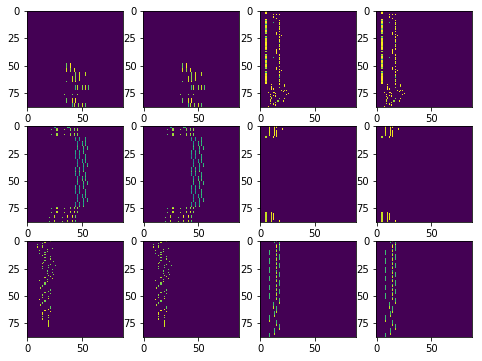

In [2]:
from os import listdir
from os.path import isfile, join
filepath = './generated_output_valid_quantized_velocities/'
onlyfiles = [f for f in listdir(filepath) if isfile(join(filepath, f))]
print(len(onlyfiles))

def read_random_data_batch(filepath, batch_size):
    global onlyfiles
    TOTAL_NUMBER_OF_MIDI_FILES = len(onlyfiles)
    songs = []
    idxs = np.random.choice(TOTAL_NUMBER_OF_MIDI_FILES, batch_size)
    for idx in idxs:
        song = np.load(filepath+onlyfiles[idx])
        while song.shape[0] < 88:
            song = np.load(filepath+onlyfiles[np.random.randint(0, len(onlyfiles))])
        song = np.array(song)/127.0
        if song.shape[0] > 88:
            start = np.random.randint(0, song.shape[0]-88)
            song = song[start:start+88, :]
        song = song.reshape(88, 88, 1)
        songs.append(song)
    return np.array(songs), np.zeros(batch_size)

def display_images(images):
    images = images.reshape(images.shape[0], images.shape[1], images.shape[2])
    random_indices = np.random.choice(images.shape[0], 8)
    idx = 0
    plt.figure(figsize=(8, 6))
    for i in range(2):
        for j in range(4):
            plt.subplot(2, 4, 4*i+j+1)
            plt.imshow(images[random_indices[idx]])
            idx += 1
    plt.show()

def display_pair(original, generated):
    original = original.reshape(original.shape[0], original.shape[1], original.shape[2])
    generated = generated.reshape(generated.shape[0], generated.shape[1], generated.shape[2])
    random_indices = np.random.choice(original.shape[0], 6)
    idx = 0
    plt.figure(figsize=(8, 6))
    for i in range(3):
        for j in range(2):
            plt.subplot(3, 4, 4*i+2*j+1)
            plt.imshow(original[random_indices[idx]])
            plt.subplot(3, 4, 4*i+2*j+2)
            plt.imshow(generated[random_indices[idx]])
            idx += 1
    plt.show()

songs, labels = read_random_data_batch(filepath, 64)
print(songs.shape)
display_pair(songs, songs)

In [3]:
def encoder(input_tensor, output_size):
    '''Create encoder network.
    Args:
        input_tensor: a batch of images [batch_size, 88, 88, 1]
    Returns:
        A tensor that expresses the encoder network
    '''
    net = tf.layers.conv2d(input_tensor, 8, 3, strides=1, activation=tf.nn.elu)
    print("E1 - ", net.get_shape())
    net = tf.layers.conv2d(net, 16, 3, strides=1, activation=tf.nn.elu)
    net = tf.layers.batch_normalization(net, name='bn1')
    print("E2 - ", net.get_shape())
    net = tf.layers.conv2d(net, 32, 3, strides=1, padding='VALID', activation=tf.nn.elu)
    print("E3 - ", net.get_shape())
    net = layers.dropout(net, keep_prob=0.9)
    
    net = tf.layers.conv2d(net, 64, 3, strides=2, padding='VALID', activation=tf.nn.elu)
    print("E4 - ", net.get_shape())
    net = tf.layers.batch_normalization(net, name='bn2')
    
    net = tf.layers.conv2d(net, 128, 5, strides=1, padding='VALID', activation=tf.nn.elu)
    print("E5 - ", net.get_shape())
    
    net = tf.layers.conv2d(net, 64, 5, strides=2, padding='VALID', activation=tf.nn.elu)
    net = tf.layers.batch_normalization(net, name='bn3')
    print("E6 - ", net.get_shape())
    #net = layers.dropout(net, keep_prob=0.9)
    net = tf.layers.conv2d(net, 32, 3, strides=2, padding='VALID', activation=tf.nn.elu)
    #print("E5 - ", net.get_shape())
    net = layers.flatten(net)
    print("E7 - ", net.get_shape())
    net = layers.fully_connected(net, output_size, activation_fn=None, reuse=None)
    return net

def decoder(input_tensor):
    '''Create decoder network.
        If input tensor is provided then decodes it, otherwise samples from
        a sampled vector.
    Args:
        input_tensor: a batch of vectors to decode
    Returns:
        A tensor that expresses the decoder network
    '''
    
    net = tf.expand_dims(input_tensor, 1)
    net = tf.expand_dims(net, 1)
    net = tf.reshape(net, [-1, 8, 8, 4])
    print("D1 - ", net.get_shape())
    net = layers.conv2d_transpose(net, 128, 4, padding='VALID', stride=1)
    print("D2 - ", net.get_shape())
    net = layers.conv2d_transpose(net, 64, 3, stride=2)
    print("D3 - ", net.get_shape())
    #net = layers.conv2d_transpose(net, 64, 3, stride=2)
    
    #print("D4 - ", net.get_shape())
    #net = layers.conv2d_transpose(net, 32, 3, stride=2)
    #print("D5 - ", net.get_shape())
    net = layers.conv2d_transpose(net, 32, 3, stride=2)
    print("D5 - ", net.get_shape())
    net = layers.conv2d_transpose(
        net, 1, 5, stride=2, activation_fn=tf.nn.sigmoid)
    print("D6 - ", net.get_shape())
    net = tf.reshape(net, [-1, 88, 88, 1])
    return net


def discriminator(input_tensor):
    '''Create encoder network.
    Args:
        input_tensor: a batch of images [batch_size, 32, 32, 3]
    Returns:
        A tensor that expresses the encoder network
    '''
    net = layers.conv2d(input_tensor, 8, 5, stride=1, activation_fn=tf.nn.elu)
    print("DI1 - ", net.get_shape())
    net = layers.conv2d(net, 16, 5, stride=2, activation_fn=tf.nn.elu)
    print("DI2 - ", net.get_shape())
    net = layers.conv2d(net, 32, 5, stride=1, padding='VALID', activation_fn=tf.nn.elu)
    print("DI3 - ", net.get_shape())
    net = layers.dropout(net, keep_prob=0.9)
    
    net = layers.conv2d(net, 64, 3, stride=2, padding='VALID', activation_fn=tf.nn.elu)
    print("DI4 - ", net.get_shape())
    
    net = layers.conv2d(net, 32, 3, stride=1, padding='VALID', activation_fn=tf.nn.elu)
    print("DI5 - ", net.get_shape())
    
    net = layers.conv2d(net, 8, 3, stride=2, padding='VALID', activation_fn=tf.nn.elu)
    print("DI6 - ", net.get_shape())
    #net = layers.dropout(net, keep_prob=0.9)
    #net = layers.conv2d(net, 32, 3, stride=2, padding='VALID')
    #print("E5 - ", net.get_shape())
    net = layers.flatten(net)
    print("DI7 - ", net.get_shape())
    net = tf.layers.dense(inputs=net, units=1, name='fc_discriminator')
    return net

In [4]:
from __future__ import absolute_import, division, print_function

import math

import numpy as np
import tensorflow as tf
from tensorflow.contrib import layers
from tensorflow.contrib import losses
from tensorflow.contrib.framework import arg_scope

In [5]:
def concat_elu(inputs):
    return tf.nn.elu(tf.concat(3, [-inputs, inputs]))

class VAEGAN():

    def __init__(self, sess, hidden_size, batch_size, learning_rate):
        
        self.sess = sess
        
        self.input_tensor = tf.placeholder(tf.float32, [None, 88, 88, 1])
        self.generator_learning_rate = tf.placeholder(tf.float32, [])
        self.discriminator_learning_rate = tf.placeholder(tf.float32, [])
        

        with arg_scope([layers.conv2d, layers.conv2d_transpose],
                       #activation_fn=concat_elu,
                       activation_fn=tf.nn.elu,
                       normalizer_fn=layers.batch_norm,
                       normalizer_params={'scale': True}):
            
            with tf.variable_scope("model"):
                D1 = discriminator(self.input_tensor)  # positive examples
                D_params_num = len(tf.trainable_variables())
                G = decoder(tf.random_normal([batch_size, hidden_size]))
                self.sampled_tensor = G
            
            with tf.variable_scope("model", reuse=True):
                D2 = discriminator(G)
                G_params_num = len(tf.trainable_variables())
            
            
            with tf.variable_scope("model", reuse=False):
                encoded = encoder(self.input_tensor, hidden_size * 2)
                mean = encoded[:, :hidden_size]
                stddev = tf.sqrt(tf.exp(encoded[:, hidden_size:]))
                
            with tf.variable_scope("model", reuse=True):
                epsilon = tf.random_normal([tf.shape(mean)[0], hidden_size])
                input_sample = mean + epsilon * stddev

                self.output_tensor = decoder(input_sample)
            
            with tf.variable_scope("model", reuse=True):
                self.sampled_tensor = decoder(tf.random_normal(
                    [batch_size, hidden_size]))

            
        D_loss = self.__get_discriminator_loss(D1, D2)
        G_loss = self.__get_generator_loss(D2)

        params = tf.trainable_variables()
        D_params = params[:D_params_num]
        G_params = params[D_params_num:G_params_num]

        global_step = tf.contrib.framework.get_or_create_global_step()
        self.train_discrimator = layers.optimize_loss(
            D_loss, global_step, self.discriminator_learning_rate, 'Adam', variables=D_params, update_ops=[])
        self.train_generator = layers.optimize_loss(
            G_loss, global_step, self.generator_learning_rate, 'Adam', variables=G_params, update_ops=[])

        vae_loss = self.__get_vae_cost(mean, stddev)
        rec_loss = self.__get_reconstruction_cost(
            self.output_tensor, self.input_tensor)

        loss = vae_loss + rec_loss
        self.train = layers.optimize_loss(loss, global_step, learning_rate=learning_rate, optimizer='Adam', update_ops=[])
        print("Model constructed")
        
    def initialize_all_variables(self):
        self.sess.run(tf.global_variables_initializer())

    def __get_discriminator_loss(self, D1, D2):
        '''Loss for the discriminator network
        Args:
            D1: logits computed with a discriminator networks from real images
            D2: logits computed with a discriminator networks from generated images
        Returns:
            Cross entropy loss, positive samples have implicit labels 1, negative 0s
        '''
        return (tf.losses.sigmoid_cross_entropy(tf.ones(tf.shape(D1)), D1) +
                tf.losses.sigmoid_cross_entropy(tf.zeros(tf.shape(D1)), D2))

    def __get_generator_loss(self, D2):
        '''Loss for the genetor. Maximize probability of generating images that
        discrimator cannot differentiate.
        Returns:
            see the paper
        '''
        return tf.losses.sigmoid_cross_entropy(tf.ones(tf.shape(D2)), D2)
        #return losses.sigmoid_cross_entropy(D2, tf.ones(tf.shape(D2)))

    def update_params_gan(self, inputs, discriminator_learning_rate, generator_learning_rate, update_disc=True):
        d_loss_value = 0
        if update_disc:
            d_loss_value = self.sess.run(self.train_discrimator, {
                    self.input_tensor: inputs, self.discriminator_learning_rate: discriminator_learning_rate})

        g_loss_value = self.sess.run(self.train_generator, {self.generator_learning_rate: generator_learning_rate})

        return g_loss_value, d_loss_value
    
    def __get_vae_cost(self, mean, stddev, epsilon=1e-8):
        '''VAE loss
            See the paper
        Args:
            mean:
            stddev:
            epsilon:
        '''
        return tf.reduce_sum(0.5 * (tf.square(mean) + tf.square(stddev) -
                                    2.0 * tf.log(stddev + epsilon) - 1.0))

    def __get_reconstruction_cost(self, output_tensor, target_tensor, epsilon=1e-8):
        '''Reconstruction loss
        Cross entropy reconstruction loss
        Args:
            output_tensor: tensor produces by decoder
            target_tensor: the target tensor that we want to reconstruct
            epsilon:
        '''
        return tf.reduce_sum(-target_tensor * tf.log(output_tensor + epsilon) -
                             (1.0 - target_tensor) * tf.log(1.0 - output_tensor + epsilon))

    def update_params_vae(self, input_tensor):
        '''Update parameters of the network
        Args:
            input_tensor: a batch of flattened images [batch_size, 28*28]
        Returns:
            Current loss value
        '''
        return self.sess.run(self.train, {self.input_tensor: input_tensor})
    
    def run_CVAE(self, input_tensor):
        return self.sess.run(self.output_tensor, {self.input_tensor: input_tensor})
    
    def generate_and_show_images(self, num_samples):
        '''Generates the images using the model and saves them in the directory
        Args:
            num_samples: number of samples to generate
            directory: a directory to save the images
        '''
        imgs = self.sess.run(self.sampled_tensor)
        imgs = imgs.reshape([-1, 88, 88, 1])
        display_images(imgs)
    
    def get_generated_images(self):
        imgs = self.sess.run(self.sampled_tensor)
        return imgs

DI1 -  (?, 88, 88, 8)
DI2 -  (?, 44, 44, 16)
DI3 -  (?, 40, 40, 32)
DI4 -  (?, 19, 19, 64)
DI5 -  (?, 17, 17, 32)
DI6 -  (?, 8, 8, 8)
DI7 -  (?, 512)
D1 -  (128, 8, 8, 4)
D2 -  (128, 11, 11, 128)
D3 -  (128, 22, 22, 64)
D5 -  (128, 44, 44, 32)
D6 -  (128, 88, 88, 1)
DI1 -  (128, 88, 88, 8)
DI2 -  (128, 44, 44, 16)
DI3 -  (128, 40, 40, 32)
DI4 -  (128, 19, 19, 64)
DI5 -  (128, 17, 17, 32)
DI6 -  (128, 8, 8, 8)
DI7 -  (128, 512)
E1 -  (?, 86, 86, 8)
E2 -  (?, 84, 84, 16)
E3 -  (?, 82, 82, 32)
E4 -  (?, 40, 40, 64)
E5 -  (?, 36, 36, 128)
E6 -  (?, 16, 16, 64)
E7 -  (?, 1568)
D1 -  (?, 8, 8, 4)
D2 -  (?, 11, 11, 128)
D3 -  (?, 22, 22, 64)
D5 -  (?, 44, 44, 32)
D6 -  (?, 88, 88, 1)
D1 -  (128, 8, 8, 4)
D2 -  (128, 11, 11, 128)
D3 -  (128, 22, 22, 64)
D5 -  (128, 44, 44, 32)
D6 -  (128, 88, 88, 1)
Model constructed
##### EPOCH -  0  ######
DISPLAYING GROUND / CVAE


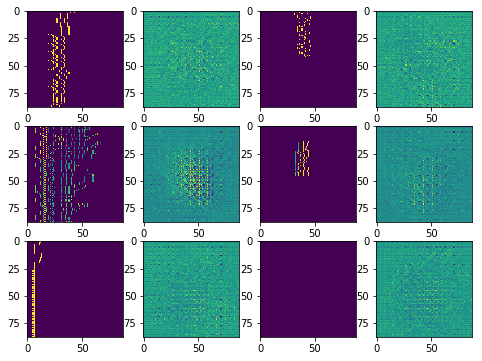

DISPLAYING GENERATED


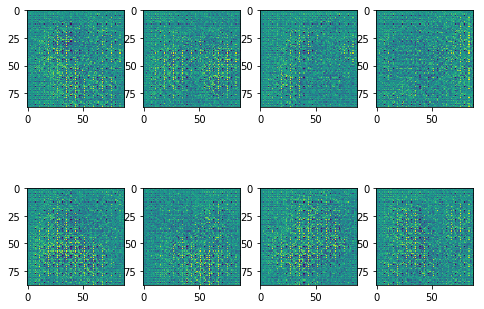

Loss VAE 5729.003743
Loss GAN GEN 0.003498
Loss GAN DISC 0.014887


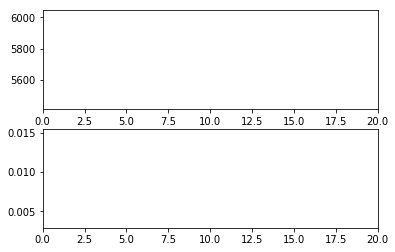

##### EPOCH -  1  ######
DISPLAYING GROUND / CVAE


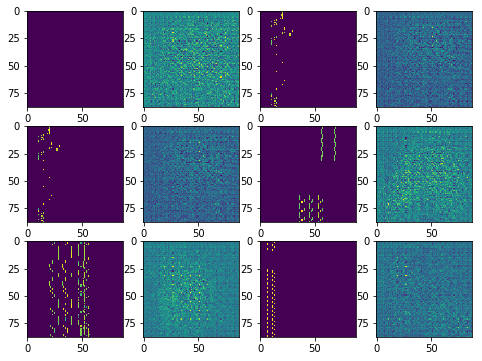

DISPLAYING GENERATED


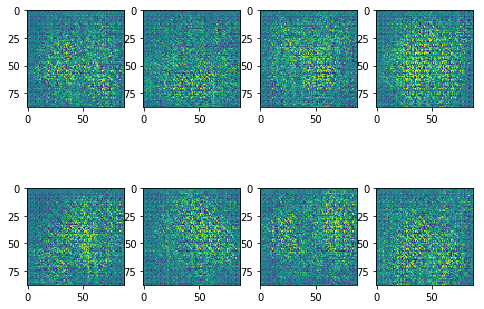

Loss VAE 5243.436599
Loss GAN GEN 0.004092
Loss GAN DISC 0.012478


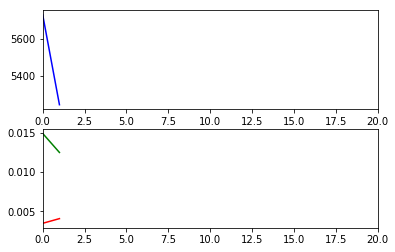

##### EPOCH -  2  ######
DISPLAYING GROUND / CVAE


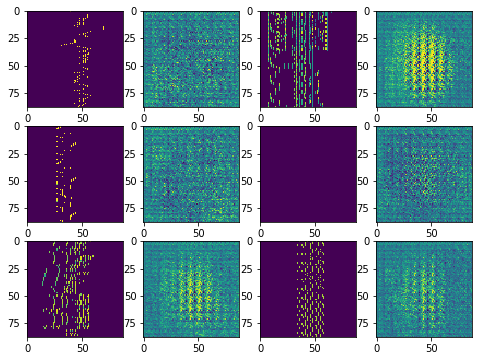

DISPLAYING GENERATED


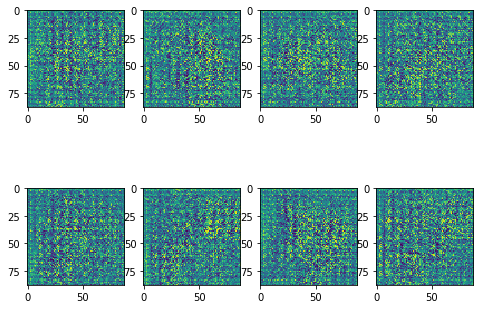

Loss VAE 4971.077061
Loss GAN GEN 0.005817
Loss GAN DISC 0.010062


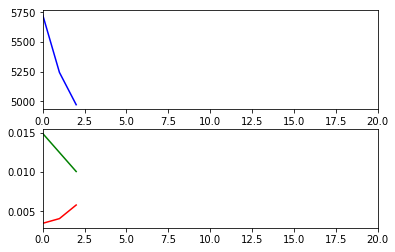

##### EPOCH -  3  ######
DISPLAYING GROUND / CVAE


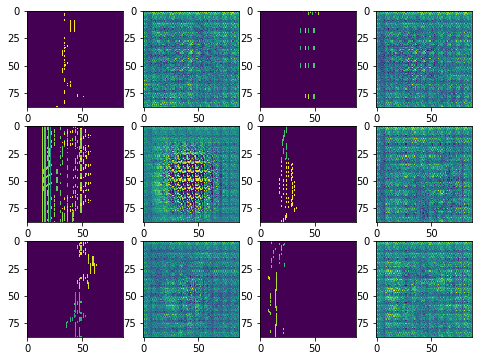

DISPLAYING GENERATED


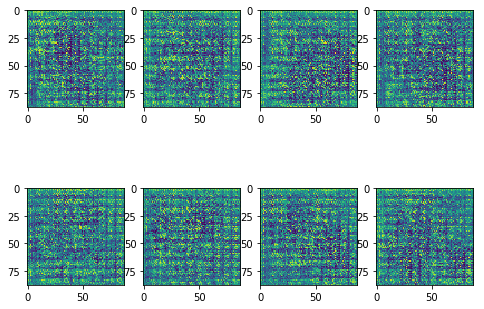

Loss VAE 4798.866436
Loss GAN GEN 0.008141
Loss GAN DISC 0.007605


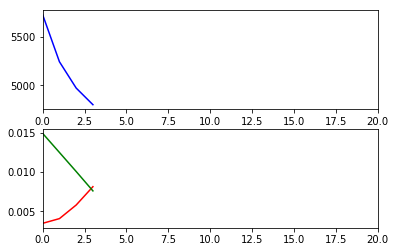

##### EPOCH -  4  ######
DISPLAYING GROUND / CVAE


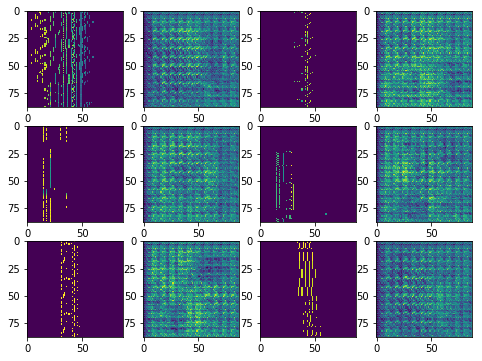

DISPLAYING GENERATED


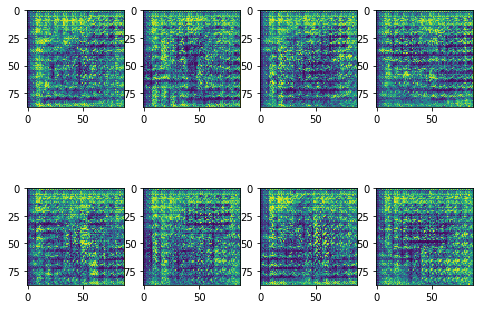

Loss VAE 4589.313113
Loss GAN GEN 0.010275
Loss GAN DISC 0.006172


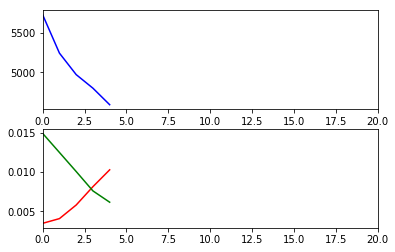

##### EPOCH -  5  ######
DISPLAYING GROUND / CVAE


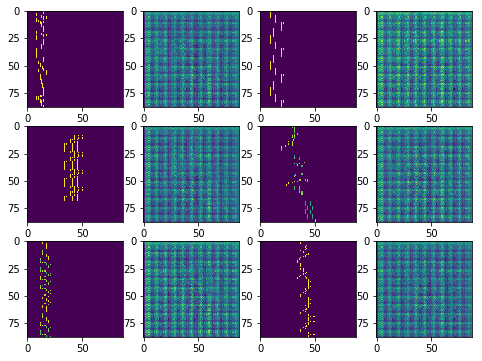

DISPLAYING GENERATED


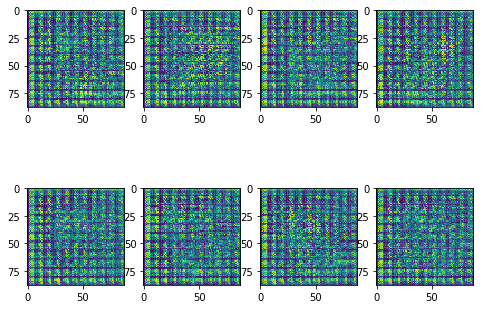

Loss VAE 4437.780086
Loss GAN GEN 0.009025
Loss GAN DISC 0.006665


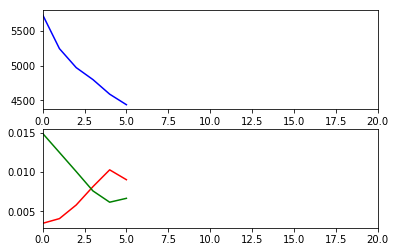

##### EPOCH -  6  ######
DISPLAYING GROUND / CVAE


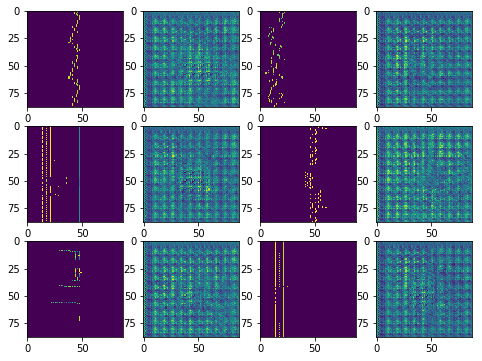

DISPLAYING GENERATED


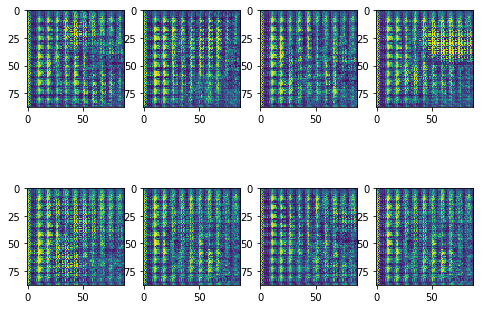

Loss VAE 4060.365810
Loss GAN GEN 0.010086
Loss GAN DISC 0.006112


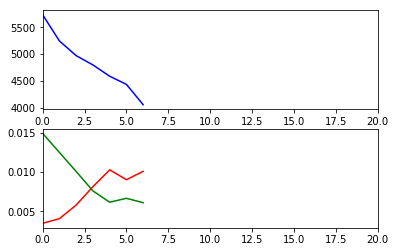

##### EPOCH -  7  ######
DISPLAYING GROUND / CVAE


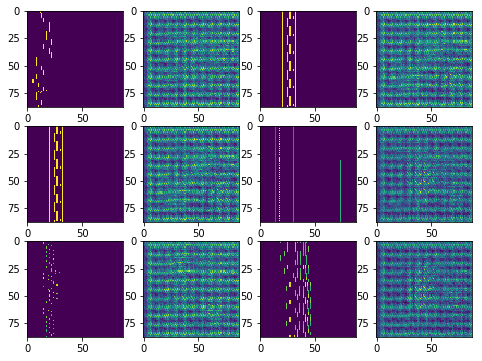

DISPLAYING GENERATED


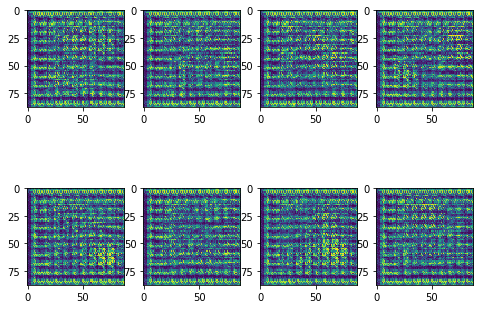

Loss VAE 3820.182523
Loss GAN GEN 0.010250
Loss GAN DISC 0.006152


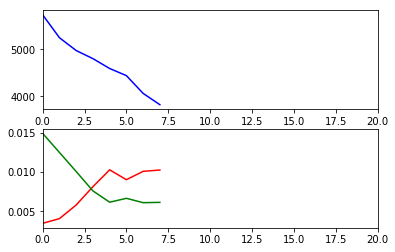

##### EPOCH -  8  ######
DISPLAYING GROUND / CVAE


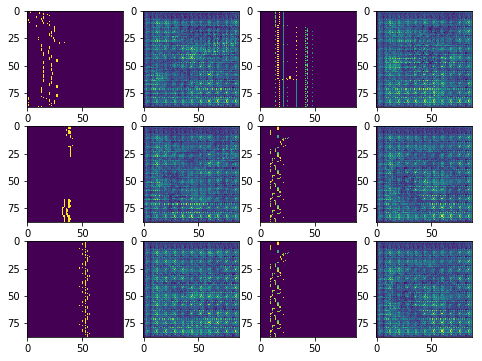

DISPLAYING GENERATED


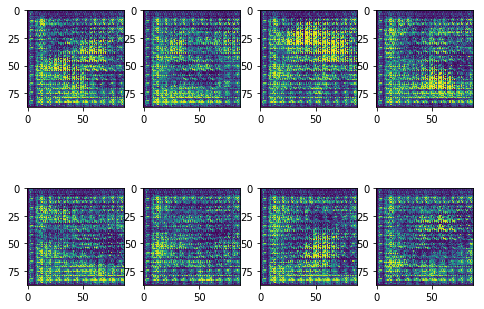

Loss VAE 3562.681584
Loss GAN GEN 0.011335
Loss GAN DISC 0.005640


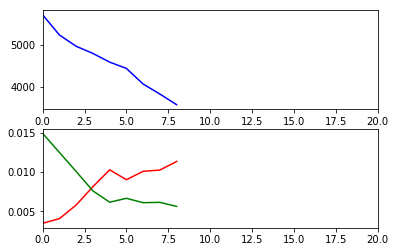

##### EPOCH -  9  ######
DISPLAYING GROUND / CVAE


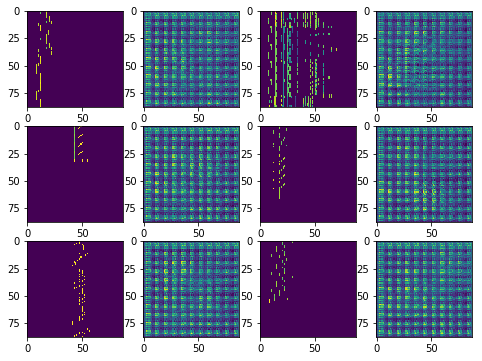

DISPLAYING GENERATED


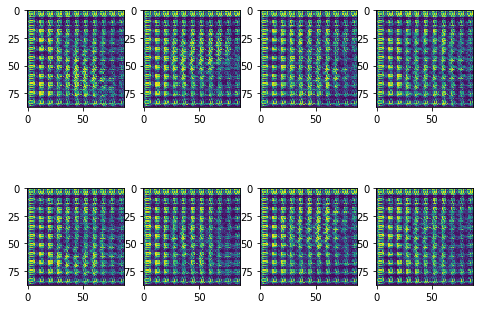

Loss VAE 3552.116768
Loss GAN GEN 0.009098
Loss GAN DISC 0.007280


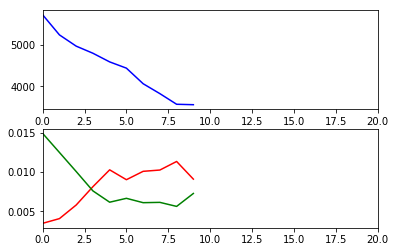

##### EPOCH -  10  ######
DISPLAYING GROUND / CVAE


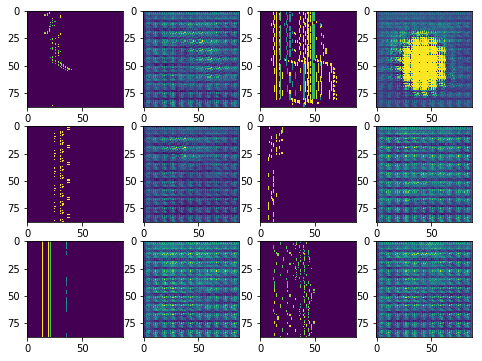

DISPLAYING GENERATED


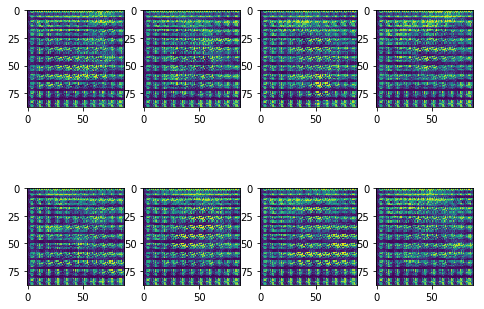

Loss VAE 3072.187838
Loss GAN GEN 0.013708
Loss GAN DISC 0.004809


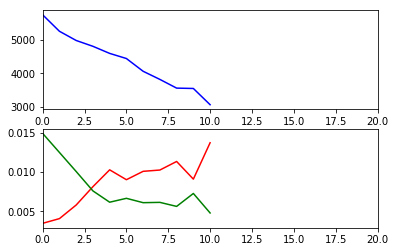

##### EPOCH -  11  ######
DISPLAYING GROUND / CVAE


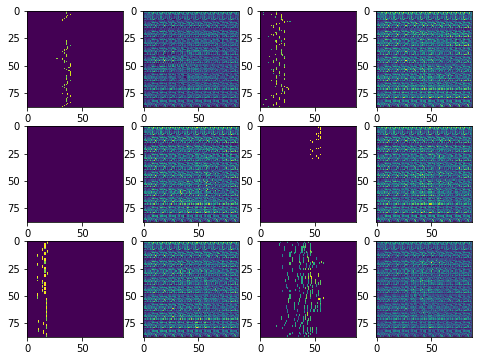

DISPLAYING GENERATED


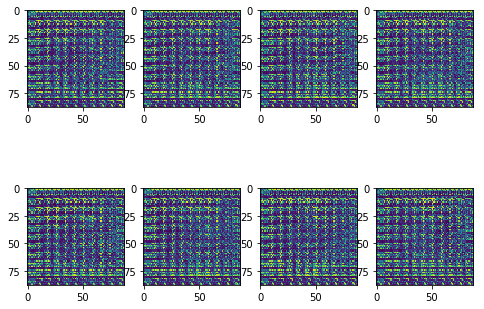

Loss VAE 3008.561849
Loss GAN GEN 0.006271
Loss GAN DISC 0.008279


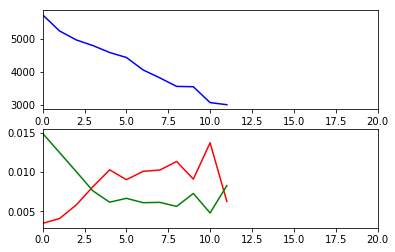

##### EPOCH -  12  ######
DISPLAYING GROUND / CVAE


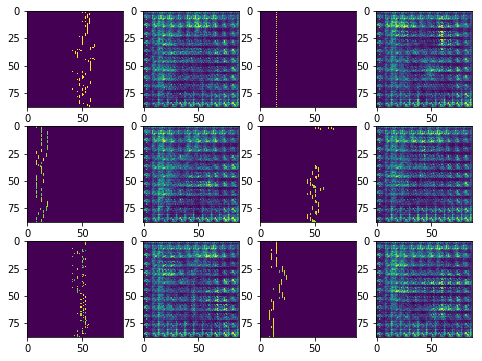

DISPLAYING GENERATED


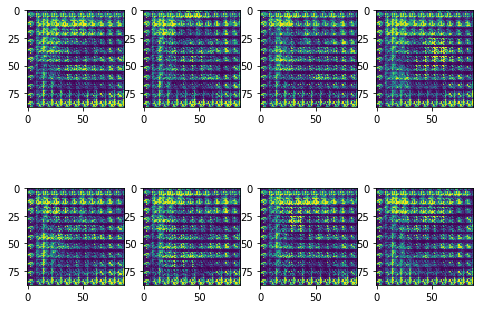

Loss VAE 2705.820187
Loss GAN GEN 0.014813
Loss GAN DISC 0.004316


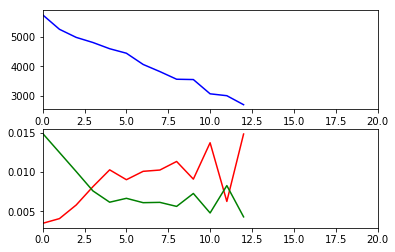

##### EPOCH -  13  ######
DISPLAYING GROUND / CVAE


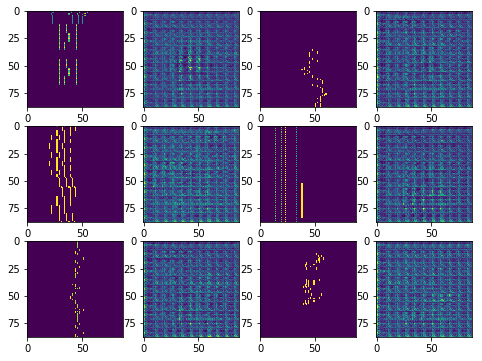

DISPLAYING GENERATED


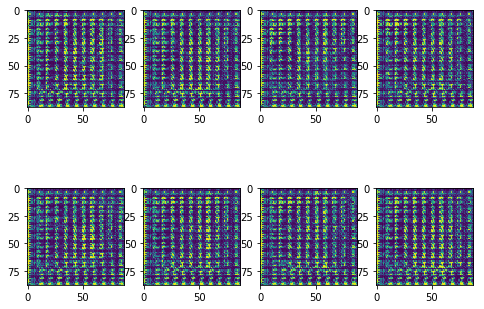

Loss VAE 2602.268824
Loss GAN GEN 0.006279
Loss GAN DISC 0.008800


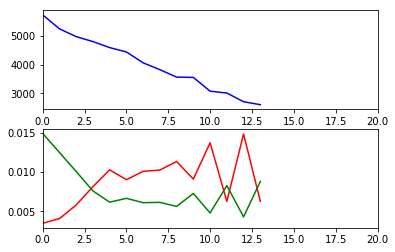

##### EPOCH -  14  ######
DISPLAYING GROUND / CVAE


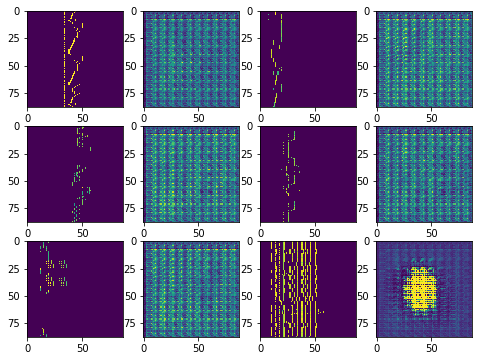

DISPLAYING GENERATED


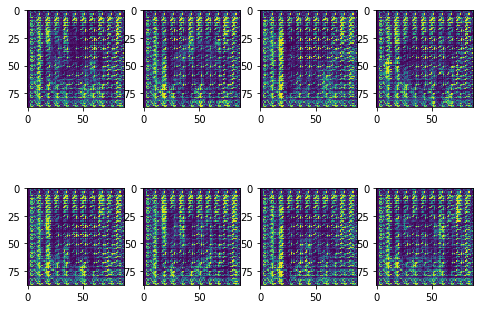

Loss VAE 2394.028746
Loss GAN GEN 0.017359
Loss GAN DISC 0.003755


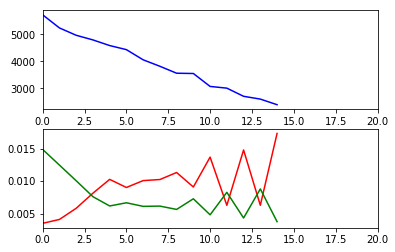

##### EPOCH -  15  ######
DISPLAYING GROUND / CVAE


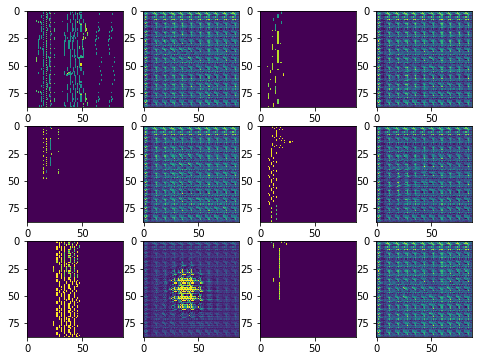

DISPLAYING GENERATED


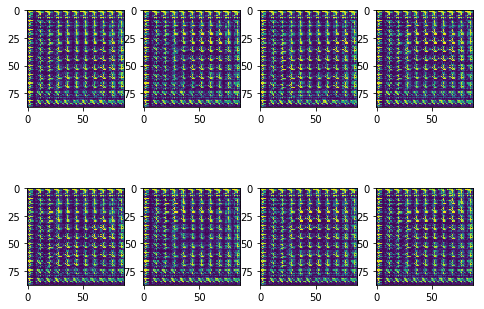

Loss VAE 2433.254031
Loss GAN GEN 0.003947
Loss GAN DISC 0.012085


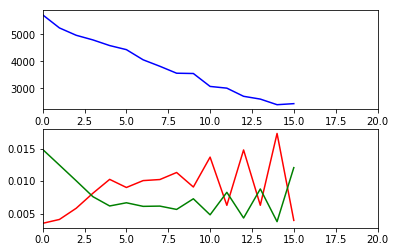

##### EPOCH -  16  ######
DISPLAYING GROUND / CVAE


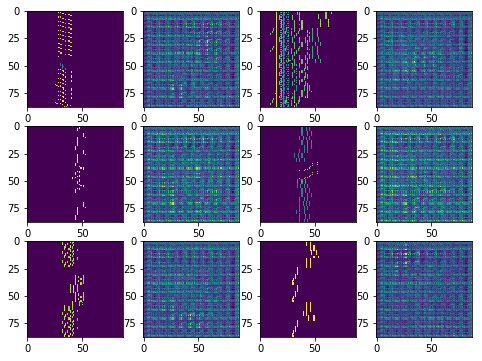

DISPLAYING GENERATED


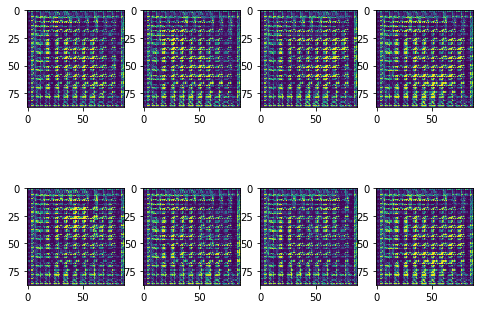

Loss VAE 2123.238488
Loss GAN GEN 0.018839
Loss GAN DISC 0.003250


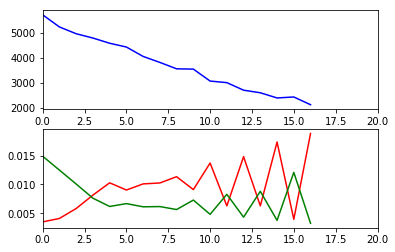

##### EPOCH -  17  ######
DISPLAYING GROUND / CVAE


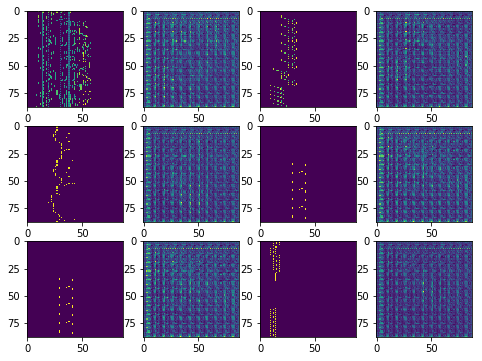

DISPLAYING GENERATED


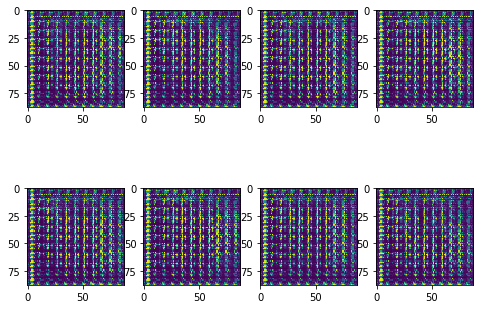

Loss VAE 2028.544963
Loss GAN GEN 0.002959
Loss GAN DISC 0.014388


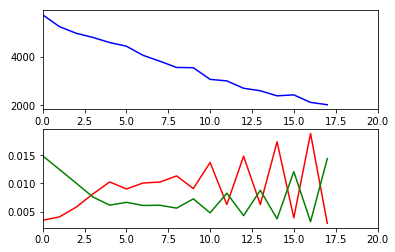

##### EPOCH -  18  ######
DISPLAYING GROUND / CVAE


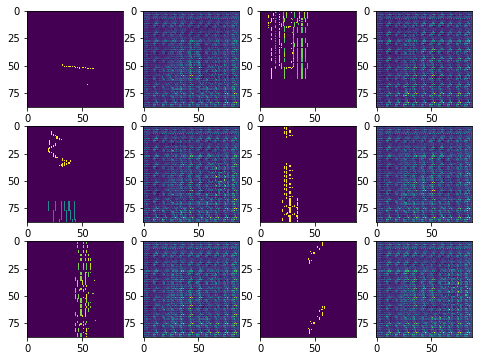

DISPLAYING GENERATED


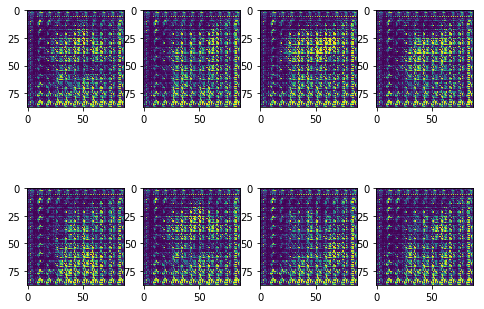

Loss VAE 2040.045304
Loss GAN GEN 0.020043
Loss GAN DISC 0.003538


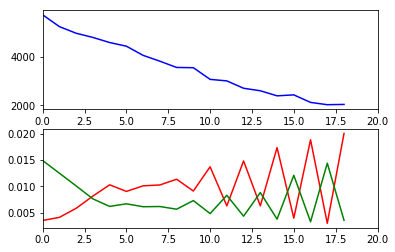

##### EPOCH -  19  ######
DISPLAYING GROUND / CVAE


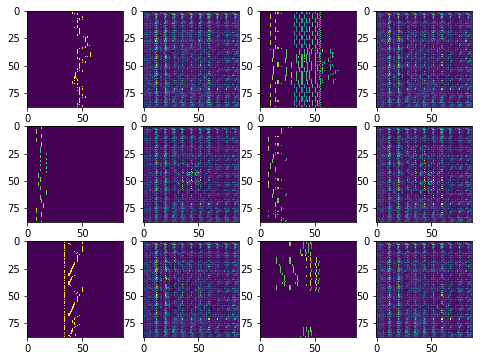

DISPLAYING GENERATED


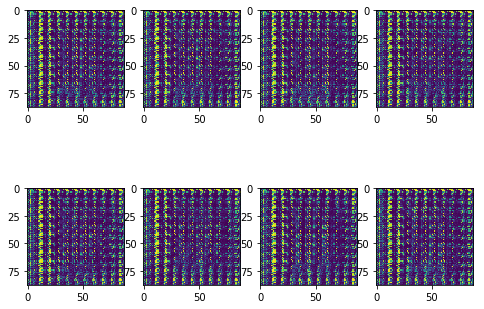

Loss VAE 2017.685224
Loss GAN GEN 0.003231
Loss GAN DISC 0.014058


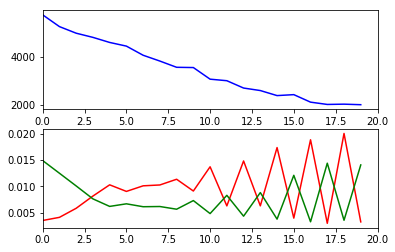

In [6]:
batch_size = 128
hidden_size = 256
learning_rate = 5e-4
gen_learning_rate = 5e-4
disc_learning_rate = 5e-5
max_epoch = 20
updates_per_epoch = int(len(onlyfiles)/batch_size)

sess = tf.Session()

VAE_INTERVAL = 2

model = VAEGAN(sess, hidden_size, batch_size, learning_rate)
model.initialize_all_variables()
generator_learning_rate = gen_learning_rate
discriminator_learning_rate = disc_learning_rate

with tf.device('/gpu:0'):
    
    training_loss_hist_vae = []
    training_loss_hist_gan_g = []
    training_loss_hist_gan_d = []
    
    for epoch in range(max_epoch):
            training_loss_vae = 0.0
            training_loss_gan_g_loss = 0.0
            training_loss_gan_d_loss = 0.0

            for i in range(updates_per_epoch):
                loss_value_vae, loss_value_gan_d_loss = 0, 0
                images, _ = read_random_data_batch(filepath, batch_size)
                if i % VAE_INTERVAL == 0:
                    loss_value_vae = model.update_params_vae(images)
                    training_loss_vae += loss_value_vae
                loss_value_gan_g_loss, loss_value_gan_d_loss = model.update_params_gan(images, discriminator_learning_rate, generator_learning_rate, True)
                training_loss_gan_g_loss += loss_value_gan_g_loss
                training_loss_gan_d_loss += loss_value_gan_d_loss
            
            print("##### EPOCH - ", epoch, " ######")
            
            ground_images, _ = read_random_data_batch(filepath, batch_size)
            cvae_images = model.run_CVAE(ground_images)
            
            print("DISPLAYING GROUND / CVAE")
            display_pair(ground_images, cvae_images)
            
            print("DISPLAYING GENERATED")
            model.generate_and_show_images(batch_size)
            
            training_loss_vae = training_loss_vae / \
                (int(updates_per_epoch/2) * batch_size)
                
            training_loss_gan_g_loss = training_loss_gan_g_loss / \
                (int(updates_per_epoch) * batch_size)
                
            training_loss_gan_d_loss = training_loss_gan_d_loss / \
                (int(updates_per_epoch) * batch_size)
            
            training_loss_hist_vae.append(training_loss_vae)
            training_loss_hist_gan_g.append(training_loss_gan_g_loss)
            training_loss_hist_gan_d.append(training_loss_gan_d_loss)
            generator_learning_rate = max(gen_learning_rate, min(gen_learning_rate * (training_loss_gan_g_loss / training_loss_gan_d_loss), gen_learning_rate*10))
            discriminator_learning_rate = min(disc_learning_rate, disc_learning_rate * (training_loss_gan_d_loss/training_loss_gan_g_loss))
            
            print("Loss VAE %f" % training_loss_vae)
            print("Loss GAN GEN %f" % training_loss_gan_g_loss)
            print("Loss GAN DISC %f" % training_loss_gan_d_loss)
            
            plt.subplot(2, 1, 1)
            plt.plot(training_loss_hist_vae, c='blue')
            plt.xlim([0, max_epoch])
            plt.subplot(2, 1, 2)
            plt.plot(training_loss_hist_gan_g, c='red')
            plt.plot(training_loss_hist_gan_d, c='green')
            plt.xlim([0, max_epoch])
            plt.show()


In [24]:
saver = tf.train.Saver()
save_path = saver.save(model.sess, "./model/model_songs_cvae_gan_song.ckpt")
print("Model Saved")

Model Saved


In [6]:
sess = tf.Session()
batch_size = 128
hidden_size = 256
learning_rate = 1e-5
max_epoch = 30
updates_per_epoch = int(len(onlyfiles)/batch_size)
model = VAEGAN(sess, hidden_size, batch_size, learning_rate)
tf_saver = tf.train.Saver()
tf_saver.restore(sess, "./model/model_songs_cvae_gan.ckpt")

DI1 -  (?, 88, 88, 8)
DI2 -  (?, 44, 44, 16)
DI3 -  (?, 40, 40, 32)
DI4 -  (?, 19, 19, 64)
DI5 -  (?, 17, 17, 32)
DI6 -  (?, 8, 8, 8)
DI7 -  (?, 512)
D1 -  (128, 8, 8, 4)
D2 -  (128, 11, 11, 128)
D3 -  (128, 22, 22, 64)
D5 -  (128, 44, 44, 32)
D6 -  (128, 88, 88, 1)
DI1 -  (128, 88, 88, 8)
DI2 -  (128, 44, 44, 16)
DI3 -  (128, 40, 40, 32)
DI4 -  (128, 19, 19, 64)
DI5 -  (128, 17, 17, 32)
DI6 -  (128, 8, 8, 8)
DI7 -  (128, 512)
E1 -  (?, 86, 86, 8)
E2 -  (?, 84, 84, 16)
E3 -  (?, 82, 82, 32)
E4 -  (?, 40, 40, 64)
E5 -  (?, 36, 36, 128)
E6 -  (?, 16, 16, 64)
E7 -  (?, 1568)
D1 -  (?, 8, 8, 4)
D2 -  (?, 11, 11, 128)
D3 -  (?, 22, 22, 64)
D5 -  (?, 44, 44, 32)
D6 -  (?, 88, 88, 1)
D1 -  (128, 8, 8, 4)
D2 -  (128, 11, 11, 128)
D3 -  (128, 22, 22, 64)
D5 -  (128, 44, 44, 32)
D6 -  (128, 88, 88, 1)
Model constructed
INFO:tensorflow:Restoring parameters from ./model/model_songs_cvae_gan.ckpt


##### EPOCH -  0  ######
DISPLAYING GROUND / CVAE


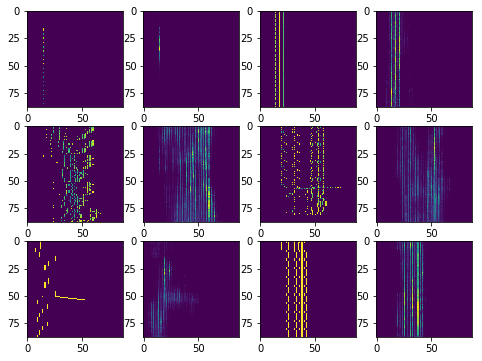

DISPLAYING GENERATED


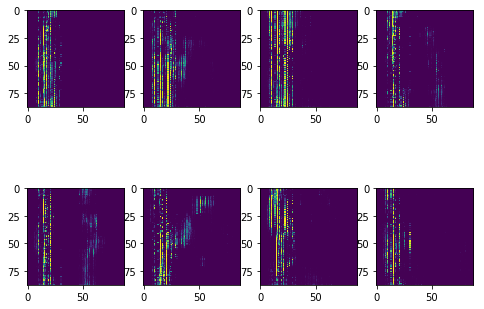

Loss VAE 1198.795150
Loss GAN GEN 0.018406
Loss GAN DISC 0.003705


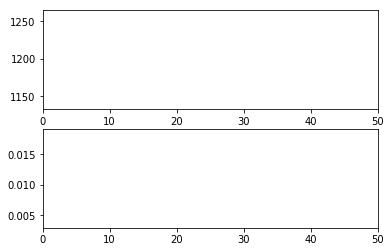

##### EPOCH -  1  ######
DISPLAYING GROUND / CVAE


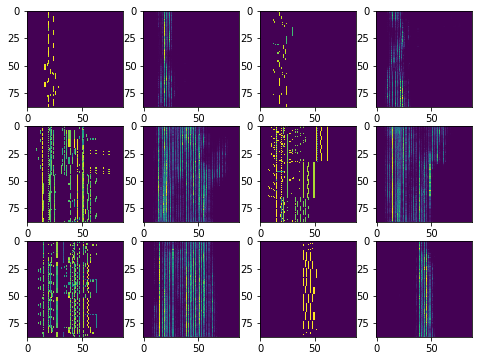

DISPLAYING GENERATED


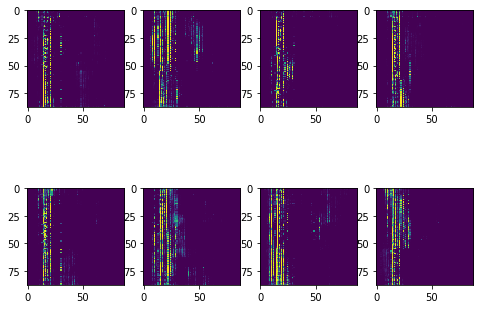

Loss VAE 1212.750770
Loss GAN GEN 0.018206
Loss GAN DISC 0.003286


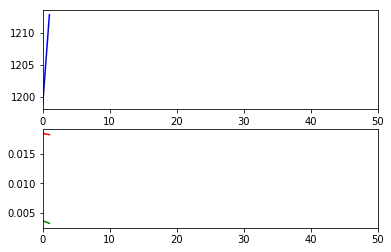

##### EPOCH -  2  ######
DISPLAYING GROUND / CVAE


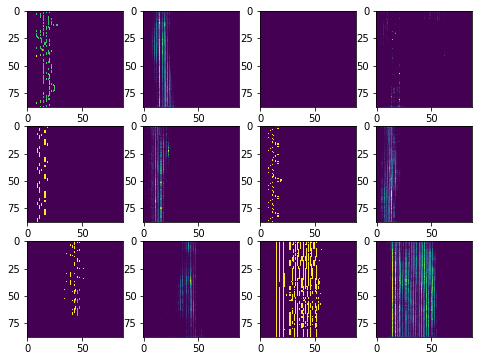

DISPLAYING GENERATED


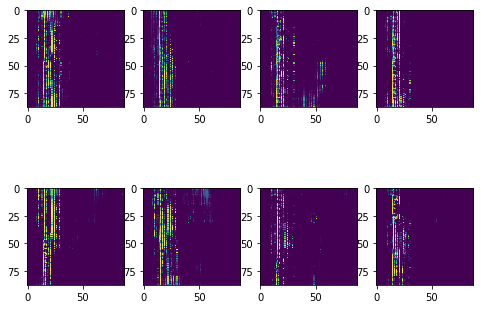

Loss VAE 1241.488400
Loss GAN GEN 0.017978
Loss GAN DISC 0.003580


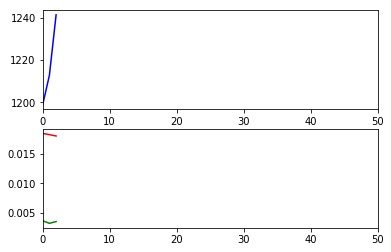

##### EPOCH -  3  ######
DISPLAYING GROUND / CVAE


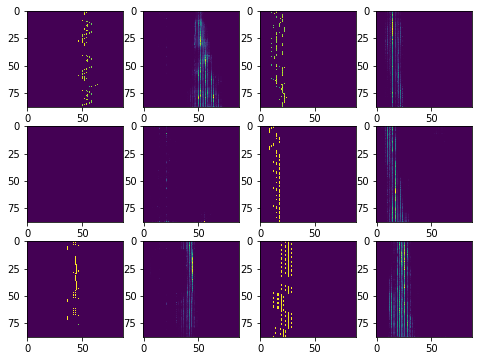

DISPLAYING GENERATED


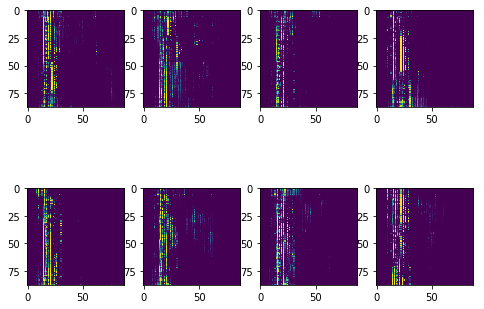

Loss VAE 1240.282271
Loss GAN GEN 0.017753
Loss GAN DISC 0.003693


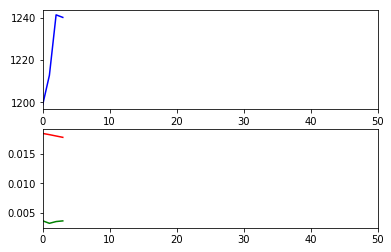

##### EPOCH -  4  ######
DISPLAYING GROUND / CVAE


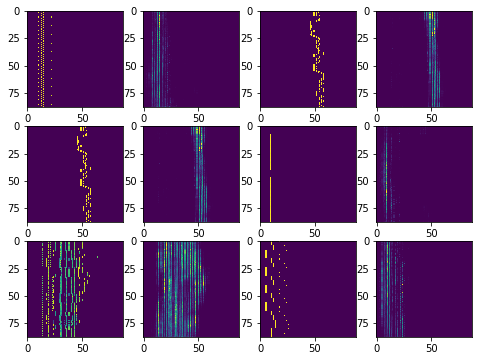

DISPLAYING GENERATED


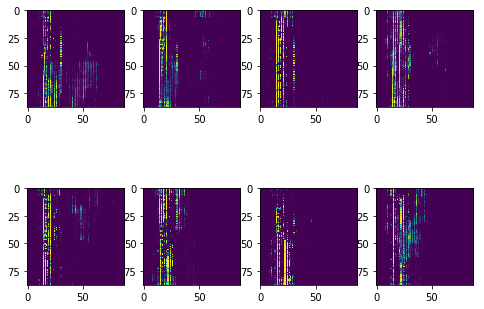

Loss VAE 1207.153895
Loss GAN GEN 0.017534
Loss GAN DISC 0.003697


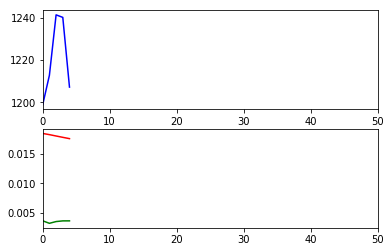

##### EPOCH -  5  ######
DISPLAYING GROUND / CVAE


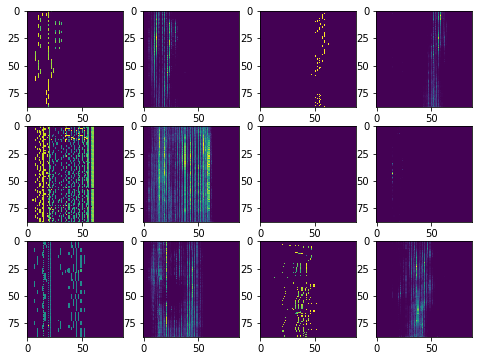

DISPLAYING GENERATED


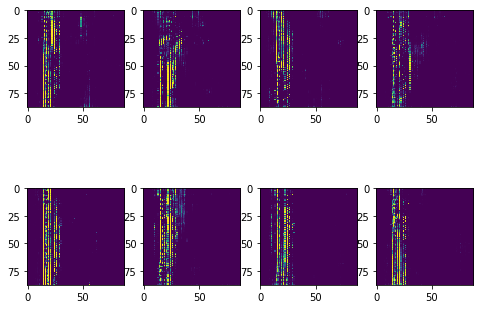

Loss VAE 1217.352444
Loss GAN GEN 0.017430
Loss GAN DISC 0.003744


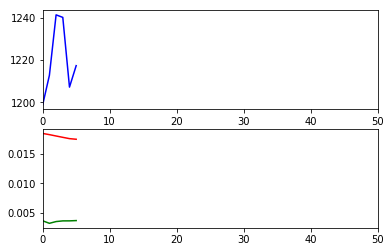

##### EPOCH -  6  ######
DISPLAYING GROUND / CVAE


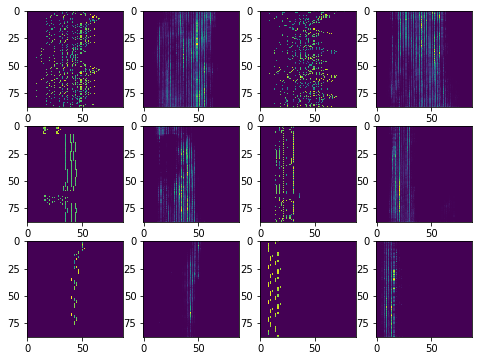

DISPLAYING GENERATED


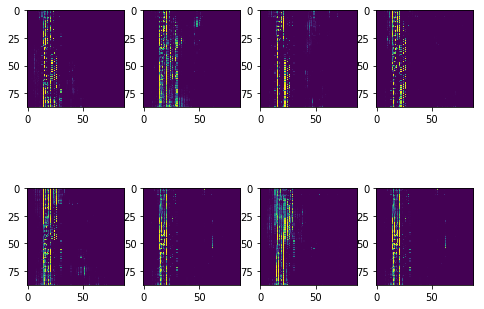

Loss VAE 1223.662989
Loss GAN GEN 0.017477
Loss GAN DISC 0.003638


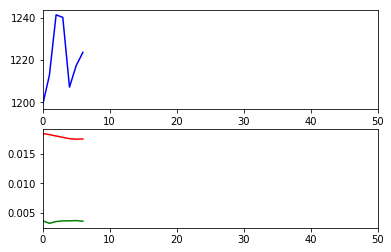

##### EPOCH -  7  ######
DISPLAYING GROUND / CVAE


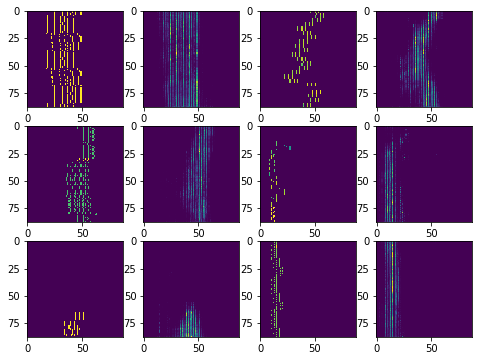

DISPLAYING GENERATED


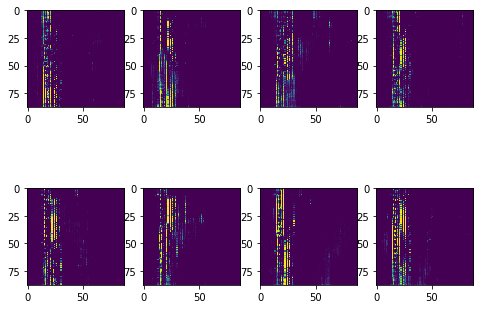

Loss VAE 1196.195564
Loss GAN GEN 0.017691
Loss GAN DISC 0.003607


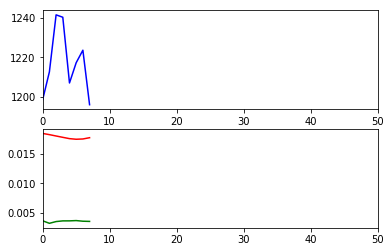

##### EPOCH -  8  ######
DISPLAYING GROUND / CVAE


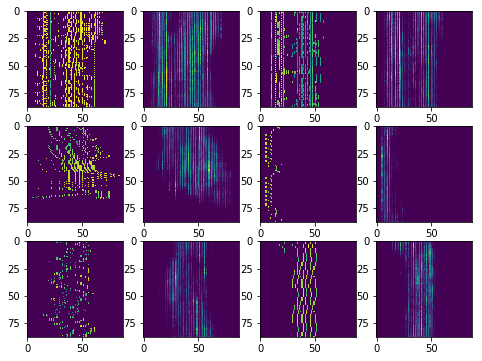

DISPLAYING GENERATED


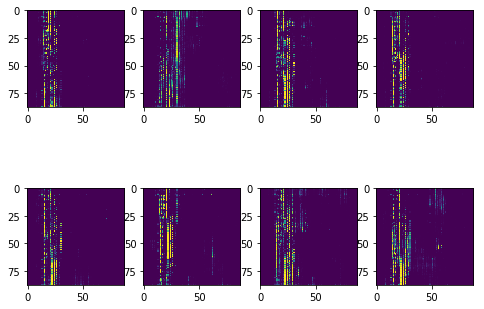

Loss VAE 1235.854361
Loss GAN GEN 0.018162
Loss GAN DISC 0.003543


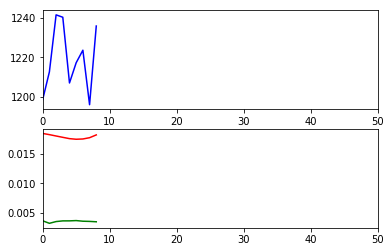

##### EPOCH -  9  ######
DISPLAYING GROUND / CVAE


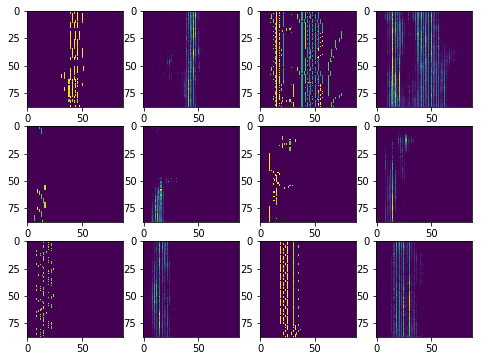

DISPLAYING GENERATED


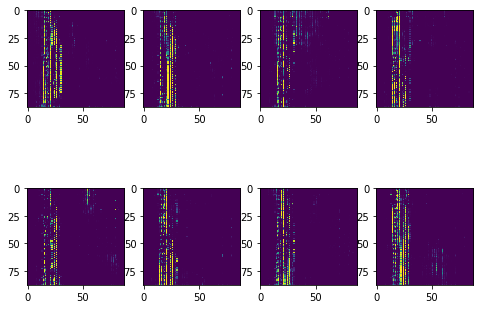

Loss VAE 1233.570048
Loss GAN GEN 0.017738
Loss GAN DISC 0.003595


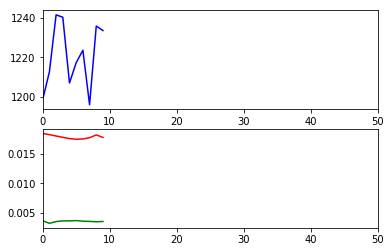

##### EPOCH -  10  ######
DISPLAYING GROUND / CVAE


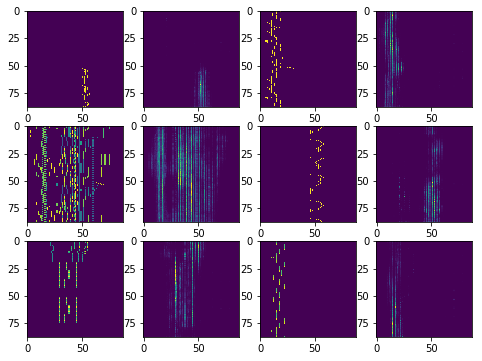

DISPLAYING GENERATED


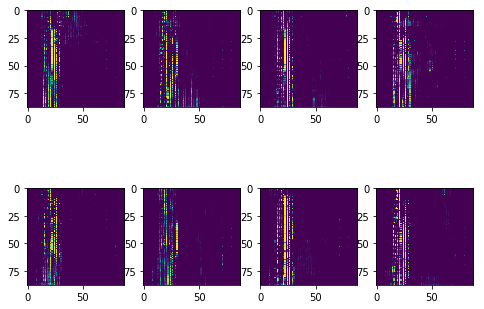

Loss VAE 1213.394383
Loss GAN GEN 0.017270
Loss GAN DISC 0.003707


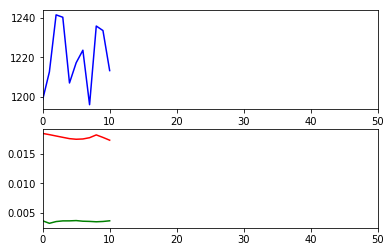

##### EPOCH -  11  ######
DISPLAYING GROUND / CVAE


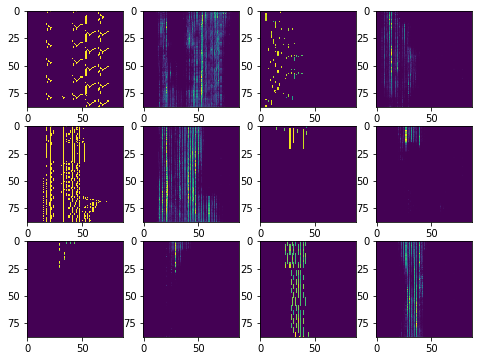

DISPLAYING GENERATED


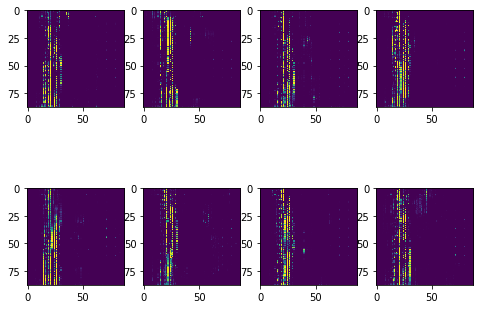

Loss VAE 1212.524259
Loss GAN GEN 0.017357
Loss GAN DISC 0.003681


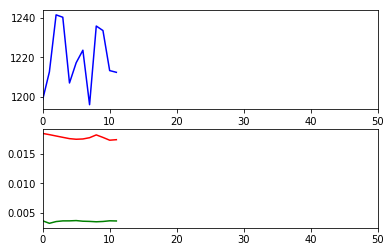

##### EPOCH -  12  ######
DISPLAYING GROUND / CVAE


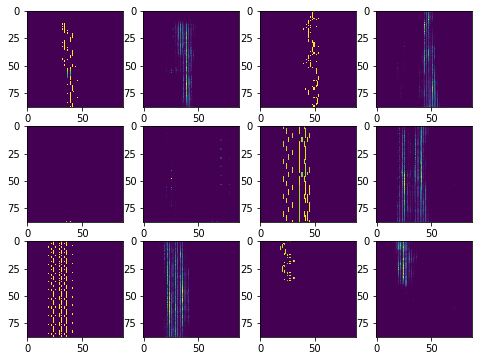

DISPLAYING GENERATED


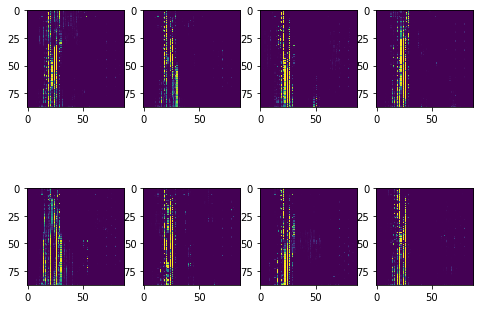

Loss VAE 1199.068243
Loss GAN GEN 0.017297
Loss GAN DISC 0.003527


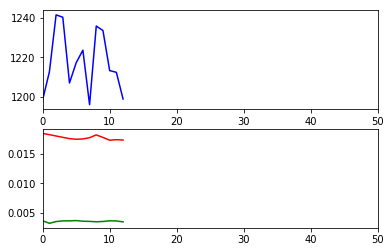

##### EPOCH -  13  ######
DISPLAYING GROUND / CVAE


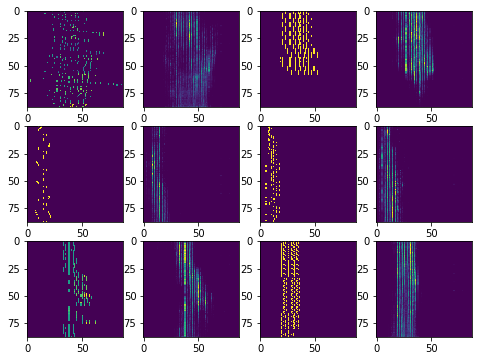

DISPLAYING GENERATED


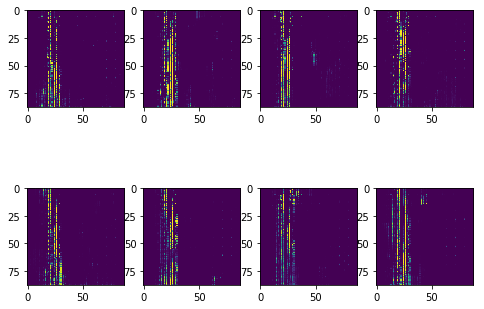

Loss VAE 1218.513817
Loss GAN GEN 0.016666
Loss GAN DISC 0.003527


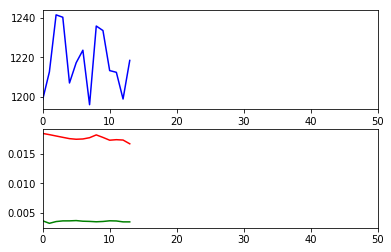

##### EPOCH -  14  ######
DISPLAYING GROUND / CVAE


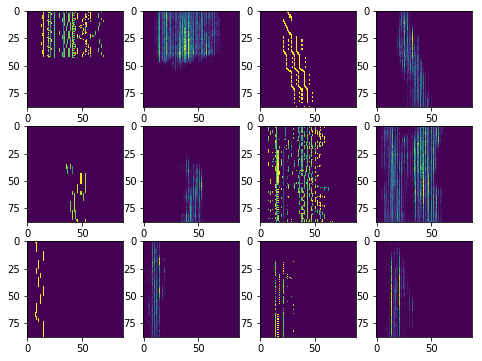

DISPLAYING GENERATED


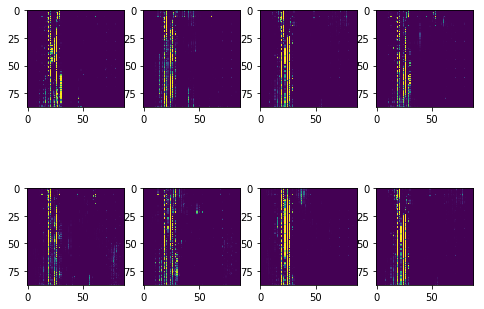

Loss VAE 1222.244451
Loss GAN GEN 0.016541
Loss GAN DISC 0.003447


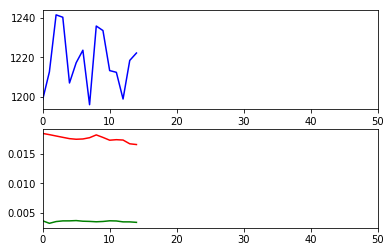

##### EPOCH -  15  ######
DISPLAYING GROUND / CVAE


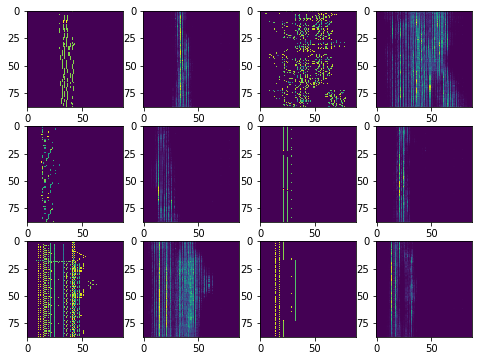

DISPLAYING GENERATED


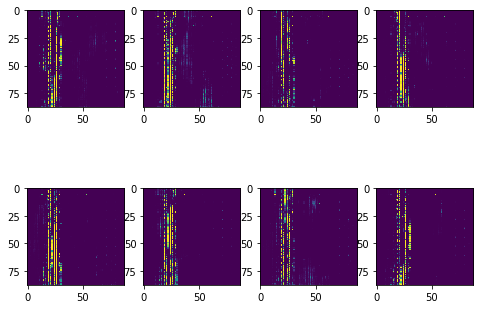

Loss VAE 1211.315498
Loss GAN GEN 0.017144
Loss GAN DISC 0.003179


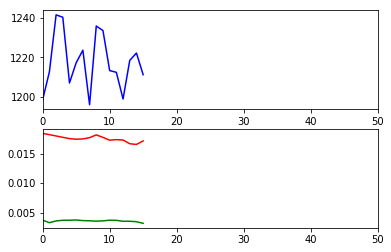

##### EPOCH -  16  ######
DISPLAYING GROUND / CVAE


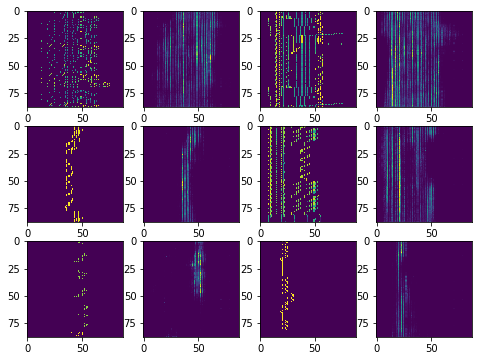

DISPLAYING GENERATED


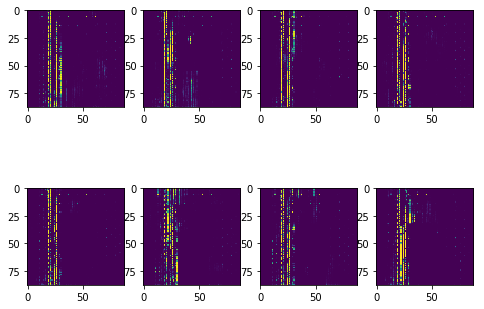

Loss VAE 1230.856420
Loss GAN GEN 0.017476
Loss GAN DISC 0.003034


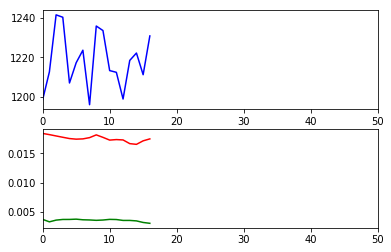

##### EPOCH -  17  ######
DISPLAYING GROUND / CVAE


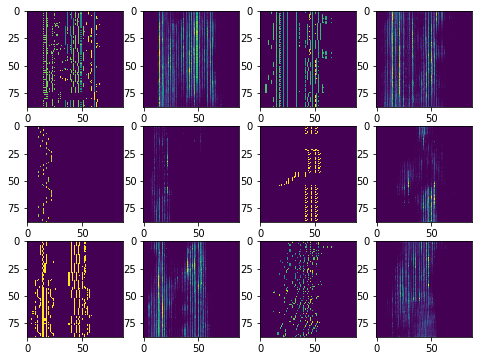

DISPLAYING GENERATED


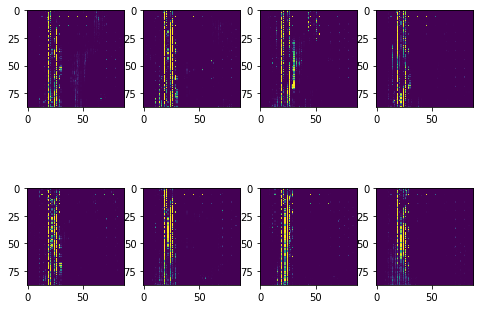

Loss VAE 1188.378477
Loss GAN GEN 0.017625
Loss GAN DISC 0.002994


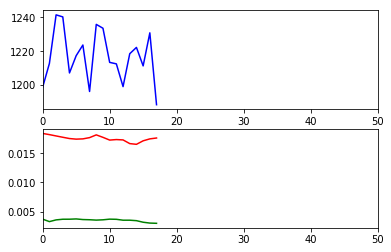

##### EPOCH -  18  ######
DISPLAYING GROUND / CVAE


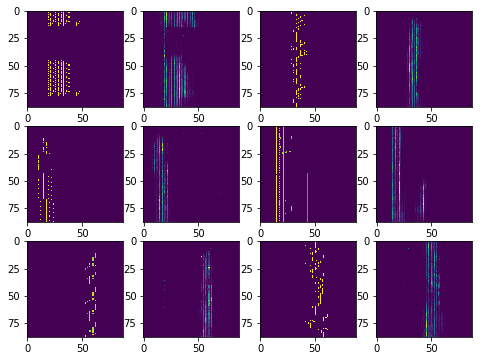

DISPLAYING GENERATED


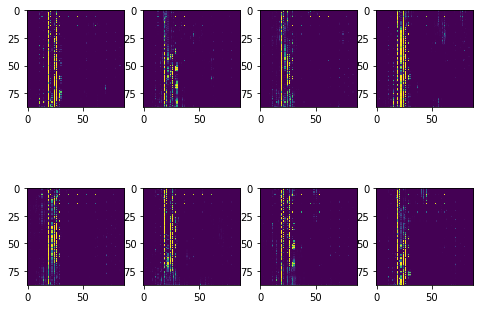

Loss VAE 1207.700771
Loss GAN GEN 0.018034
Loss GAN DISC 0.002913


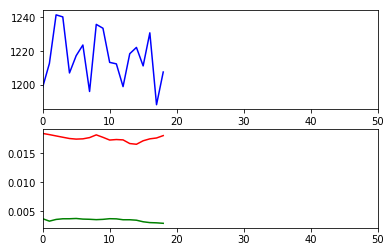

##### EPOCH -  19  ######
DISPLAYING GROUND / CVAE


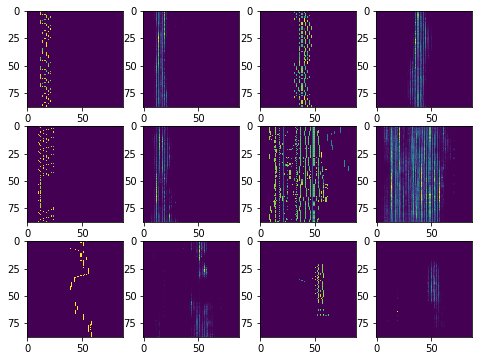

DISPLAYING GENERATED


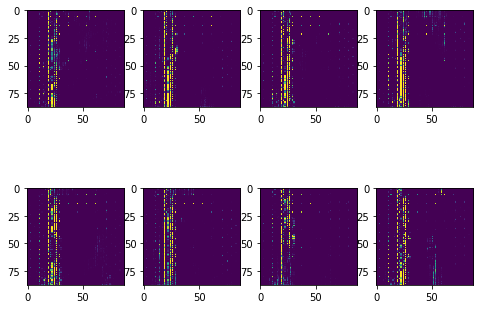

Loss VAE 1222.825497
Loss GAN GEN 0.018150
Loss GAN DISC 0.002977


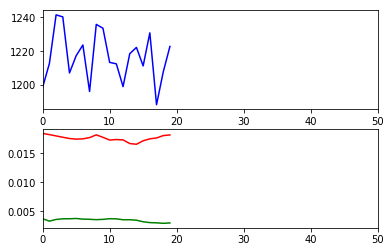

##### EPOCH -  20  ######
DISPLAYING GROUND / CVAE


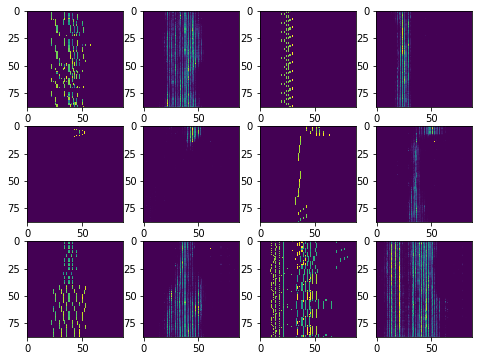

DISPLAYING GENERATED


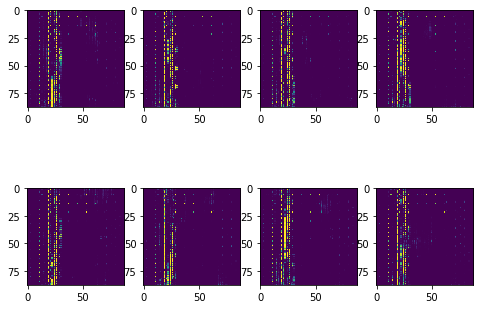

Loss VAE 1241.700172
Loss GAN GEN 0.018299
Loss GAN DISC 0.002885


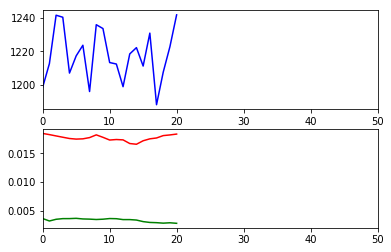

##### EPOCH -  21  ######
DISPLAYING GROUND / CVAE


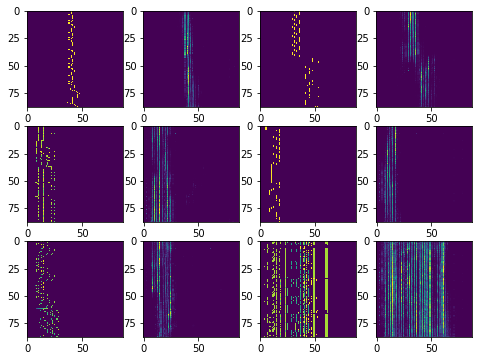

DISPLAYING GENERATED


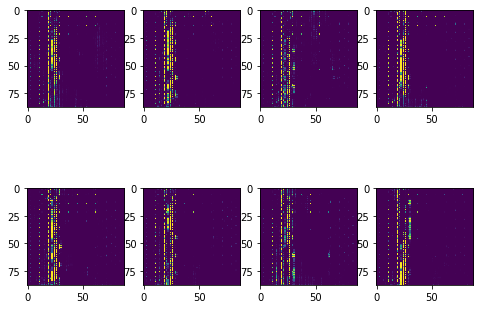

Loss VAE 1226.196036
Loss GAN GEN 0.019098
Loss GAN DISC 0.002847


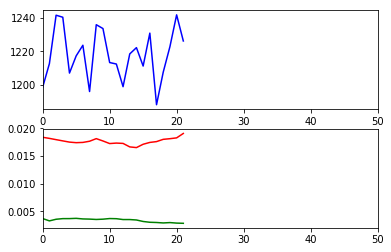

##### EPOCH -  22  ######
DISPLAYING GROUND / CVAE


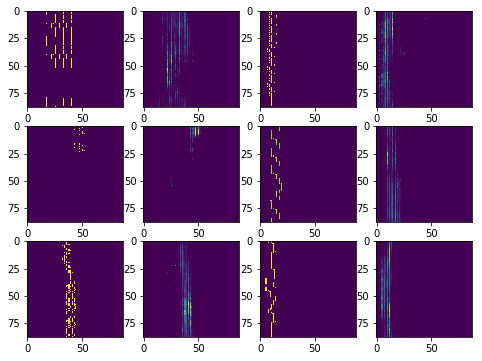

DISPLAYING GENERATED


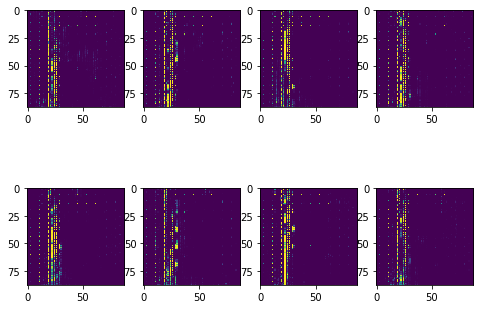

Loss VAE 1202.016275
Loss GAN GEN 0.019279
Loss GAN DISC 0.002834


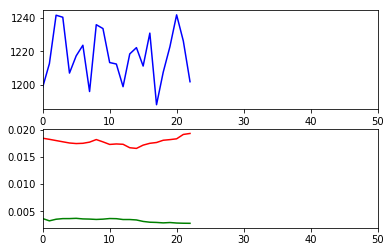

##### EPOCH -  23  ######
DISPLAYING GROUND / CVAE


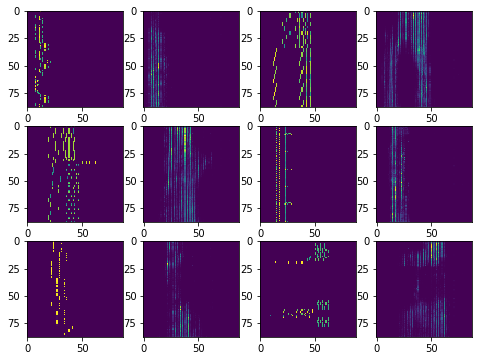

DISPLAYING GENERATED


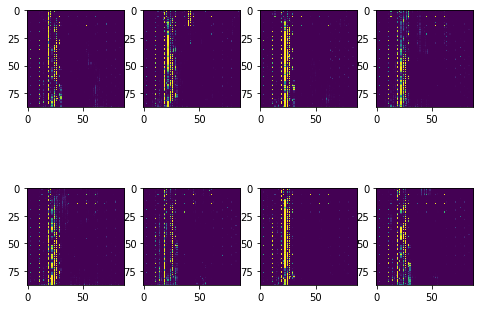

Loss VAE 1226.620335
Loss GAN GEN 0.019801
Loss GAN DISC 0.002648


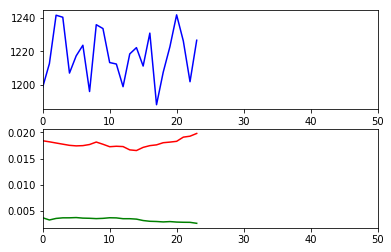

##### EPOCH -  24  ######
DISPLAYING GROUND / CVAE


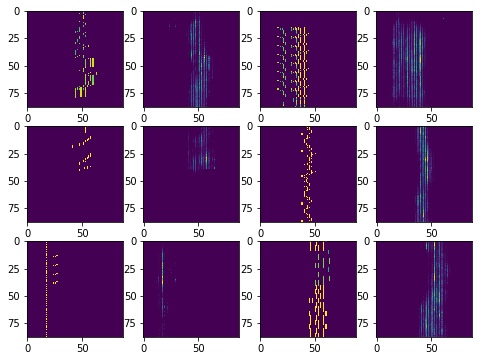

DISPLAYING GENERATED


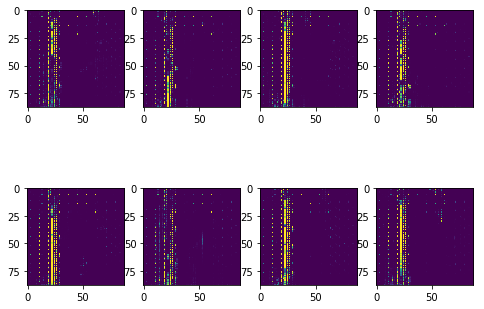

Loss VAE 1222.564076
Loss GAN GEN 0.019887
Loss GAN DISC 0.002573


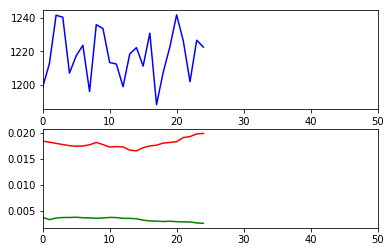

##### EPOCH -  25  ######
DISPLAYING GROUND / CVAE


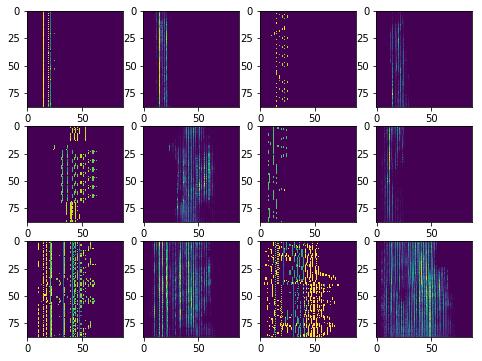

DISPLAYING GENERATED


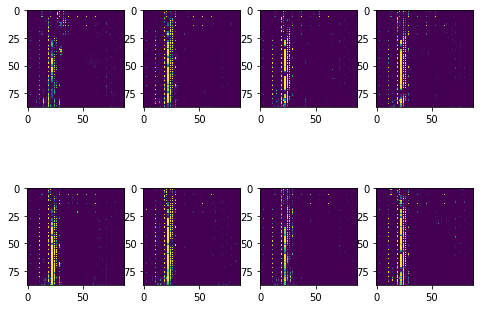

Loss VAE 1211.809189
Loss GAN GEN 0.019769
Loss GAN DISC 0.002543


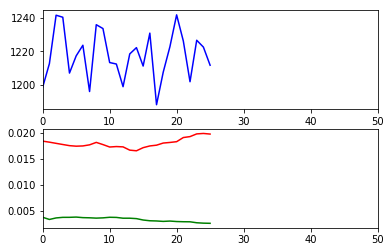

##### EPOCH -  26  ######
DISPLAYING GROUND / CVAE


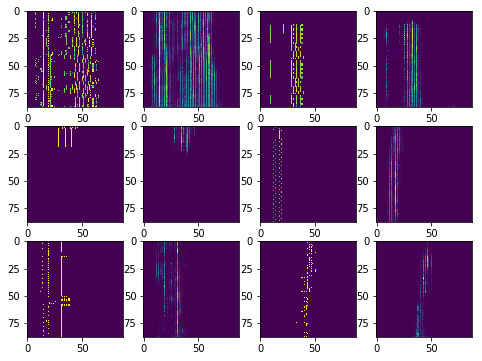

DISPLAYING GENERATED


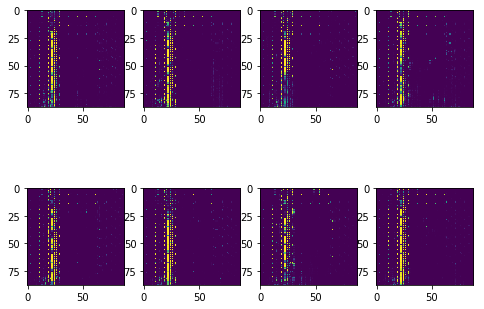

Loss VAE 1218.576313
Loss GAN GEN 0.019573
Loss GAN DISC 0.002634


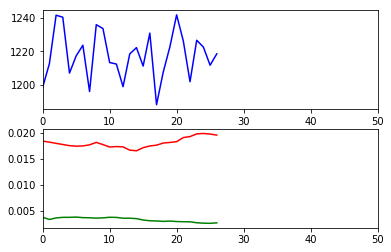

##### EPOCH -  27  ######
DISPLAYING GROUND / CVAE


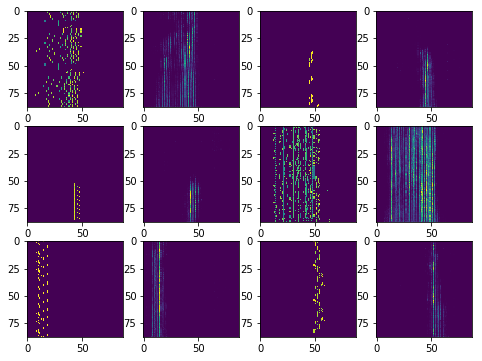

DISPLAYING GENERATED


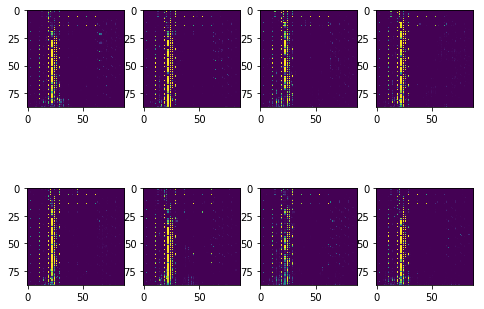

Loss VAE 1216.275107
Loss GAN GEN 0.019426
Loss GAN DISC 0.002557


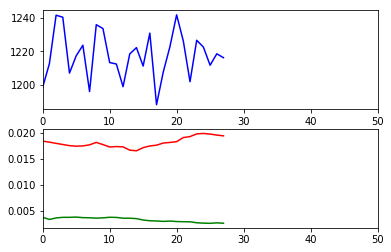

##### EPOCH -  28  ######
DISPLAYING GROUND / CVAE


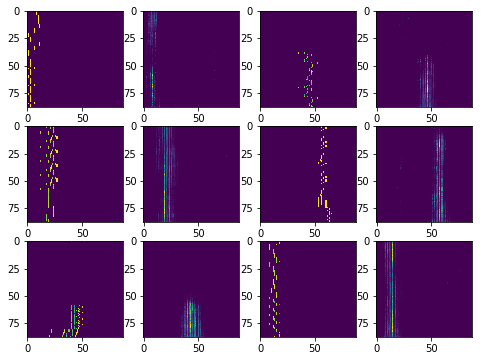

DISPLAYING GENERATED


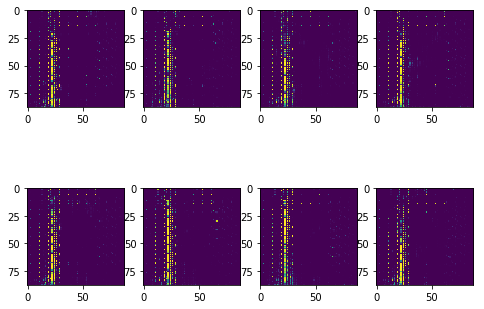

Loss VAE 1213.998841
Loss GAN GEN 0.019736
Loss GAN DISC 0.002539


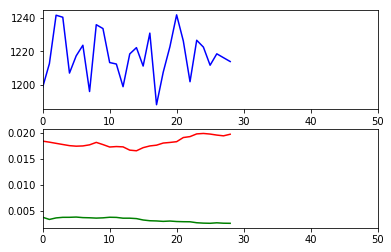

##### EPOCH -  29  ######
DISPLAYING GROUND / CVAE


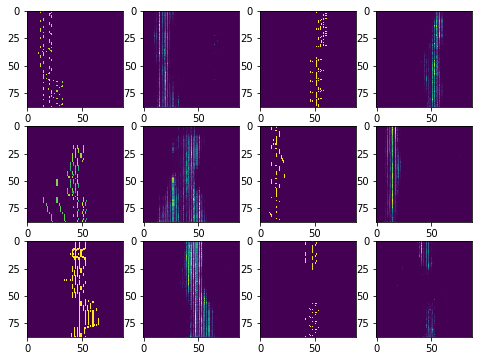

DISPLAYING GENERATED


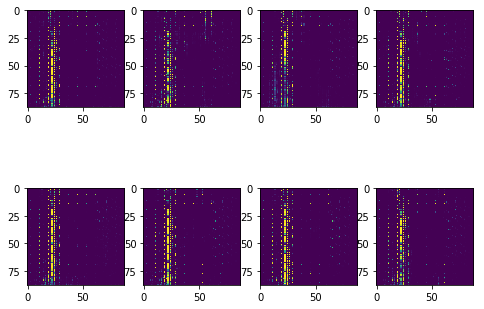

Loss VAE 1213.189306
Loss GAN GEN 0.019872
Loss GAN DISC 0.002467


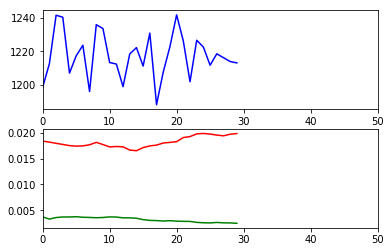

##### EPOCH -  30  ######
DISPLAYING GROUND / CVAE


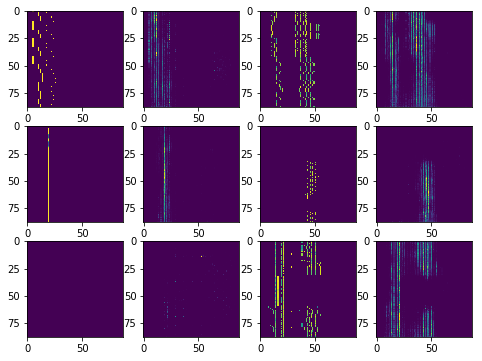

DISPLAYING GENERATED


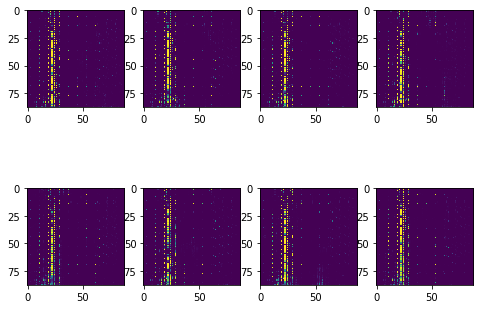

Loss VAE 1193.295671
Loss GAN GEN 0.020108
Loss GAN DISC 0.002396


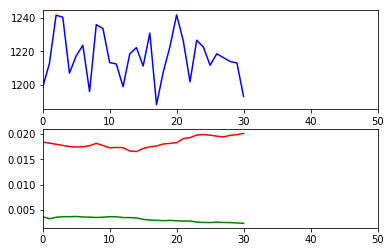

##### EPOCH -  31  ######
DISPLAYING GROUND / CVAE


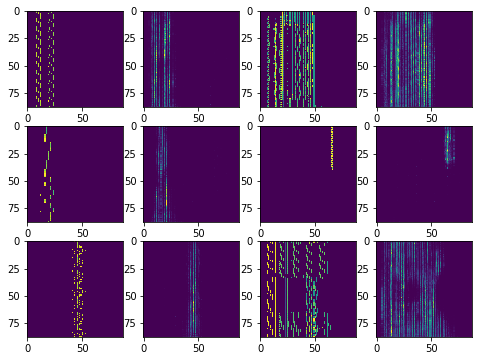

DISPLAYING GENERATED


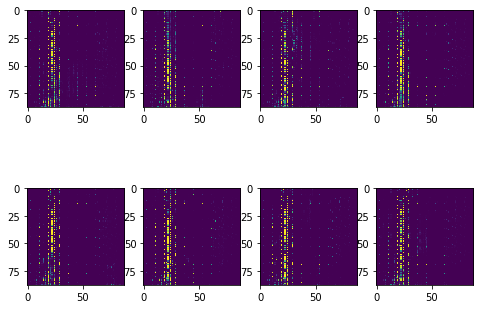

Loss VAE 1221.145208
Loss GAN GEN 0.020369
Loss GAN DISC 0.002522


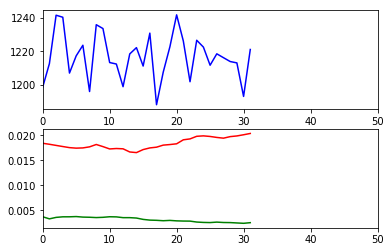

##### EPOCH -  32  ######
DISPLAYING GROUND / CVAE


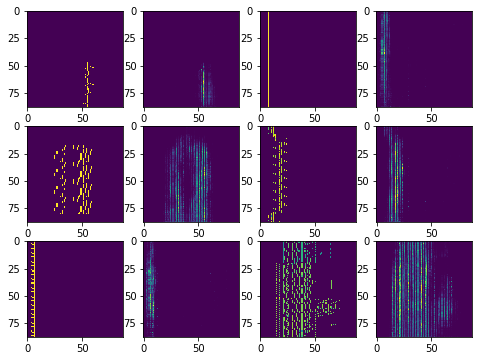

DISPLAYING GENERATED


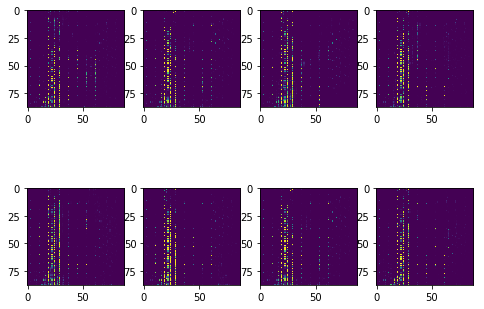

Loss VAE 1223.173919
Loss GAN GEN 0.020379
Loss GAN DISC 0.002588


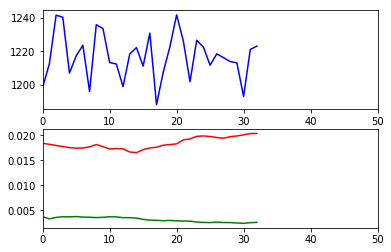

##### EPOCH -  33  ######
DISPLAYING GROUND / CVAE


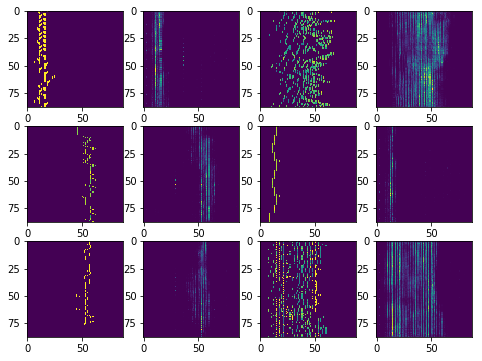

DISPLAYING GENERATED


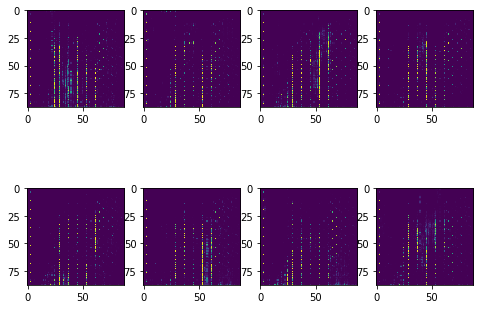

Loss VAE 1237.596712
Loss GAN GEN 0.009386
Loss GAN DISC 0.009138


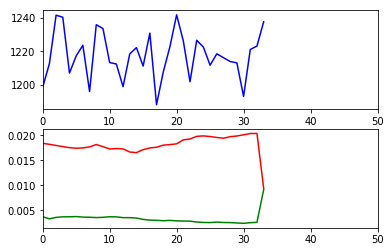

##### EPOCH -  34  ######
DISPLAYING GROUND / CVAE


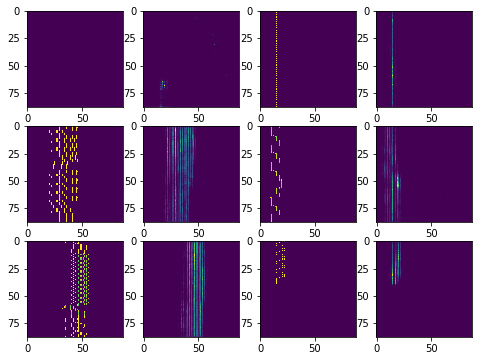

DISPLAYING GENERATED


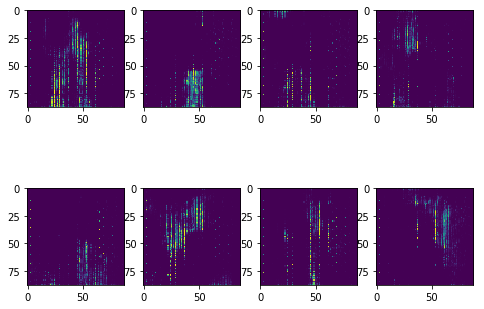

Loss VAE 1215.823295
Loss GAN GEN 0.020619
Loss GAN DISC 0.003441


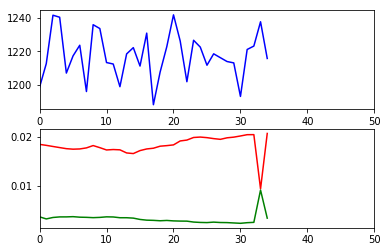

##### EPOCH -  35  ######
DISPLAYING GROUND / CVAE


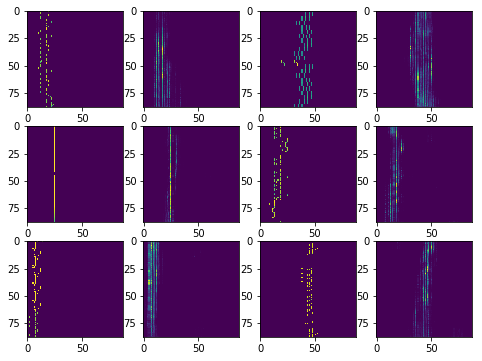

DISPLAYING GENERATED


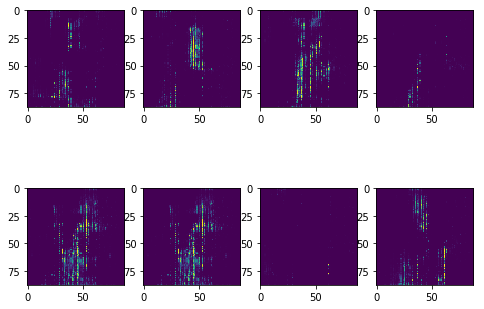

Loss VAE 1165.951616
Loss GAN GEN 0.015404
Loss GAN DISC 0.003005


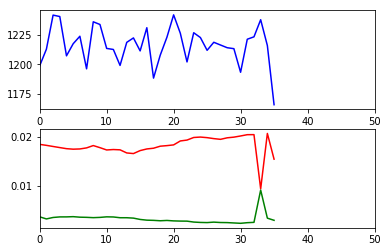

##### EPOCH -  36  ######
DISPLAYING GROUND / CVAE


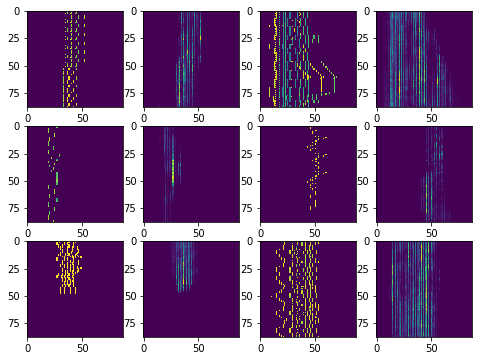

DISPLAYING GENERATED


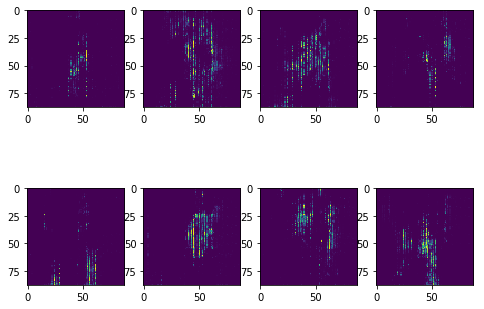

Loss VAE 1199.333103
Loss GAN GEN 0.014639
Loss GAN DISC 0.003359


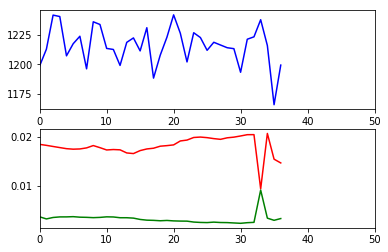

##### EPOCH -  37  ######
DISPLAYING GROUND / CVAE


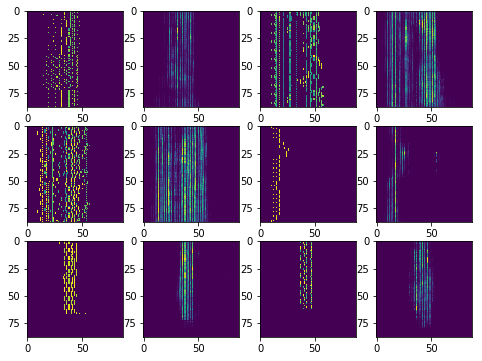

DISPLAYING GENERATED


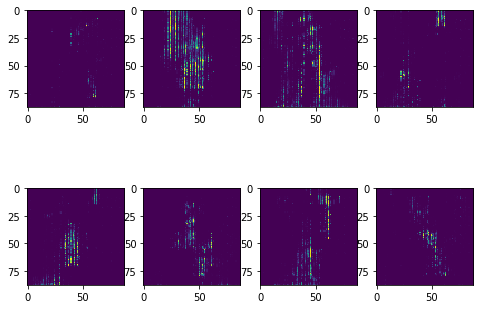

Loss VAE 1187.808598
Loss GAN GEN 0.015712
Loss GAN DISC 0.003181


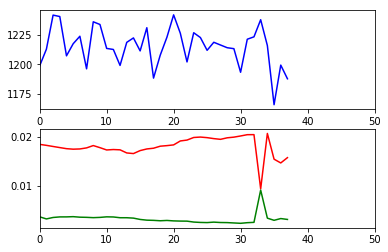

##### EPOCH -  38  ######
DISPLAYING GROUND / CVAE


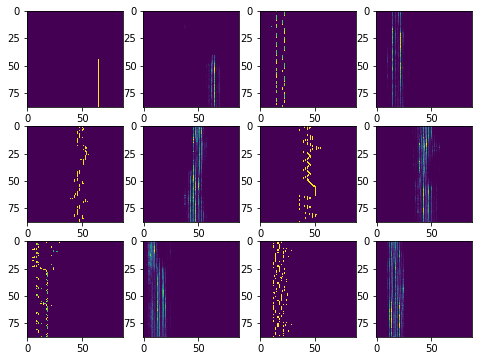

DISPLAYING GENERATED


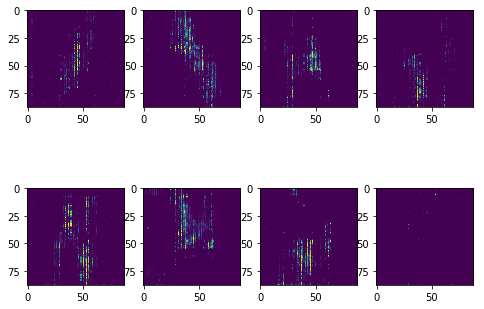

Loss VAE 1189.922401
Loss GAN GEN 0.016387
Loss GAN DISC 0.003193


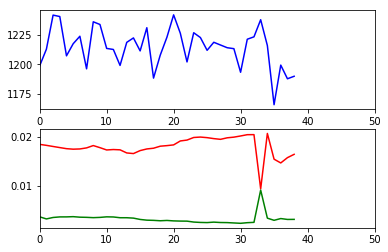

##### EPOCH -  39  ######
DISPLAYING GROUND / CVAE


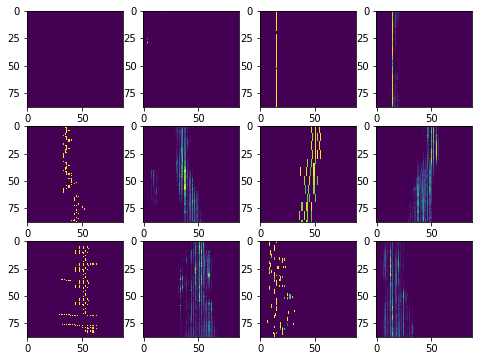

DISPLAYING GENERATED


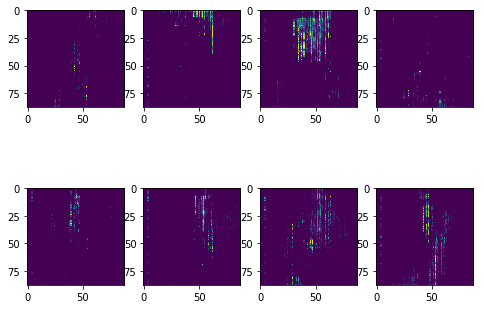

Loss VAE 1202.388453
Loss GAN GEN 0.016343
Loss GAN DISC 0.003139


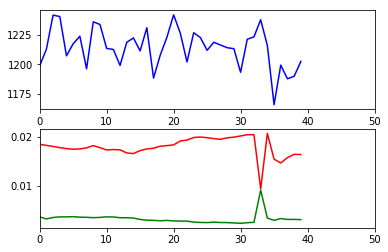

##### EPOCH -  40  ######
DISPLAYING GROUND / CVAE


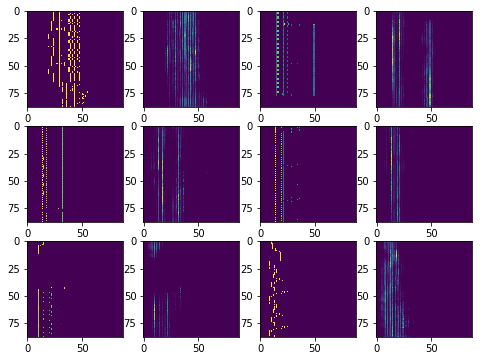

DISPLAYING GENERATED


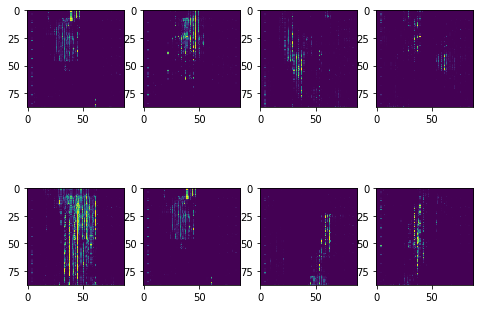

Loss VAE 1175.389551
Loss GAN GEN 0.016498
Loss GAN DISC 0.003056


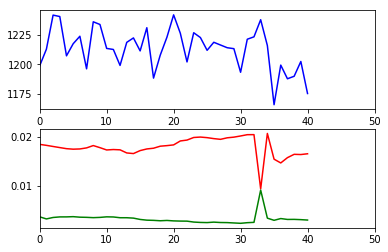

##### EPOCH -  41  ######
DISPLAYING GROUND / CVAE


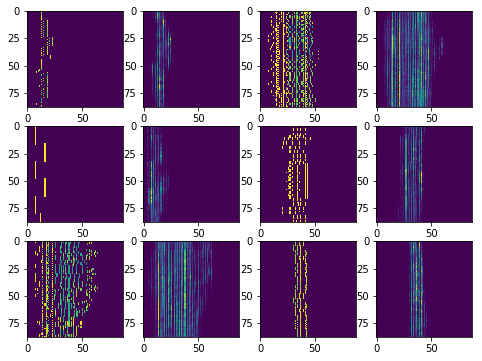

DISPLAYING GENERATED


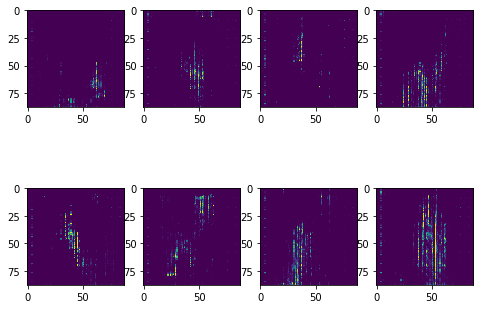

Loss VAE 1174.352556
Loss GAN GEN 0.016515
Loss GAN DISC 0.003041


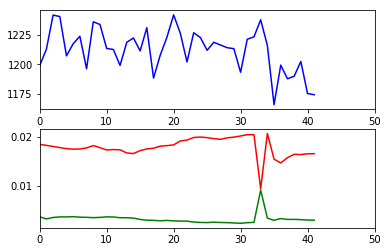

##### EPOCH -  42  ######
DISPLAYING GROUND / CVAE


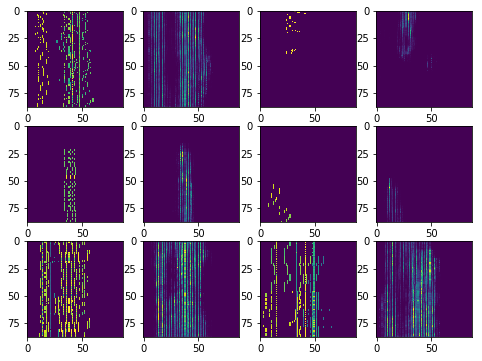

DISPLAYING GENERATED


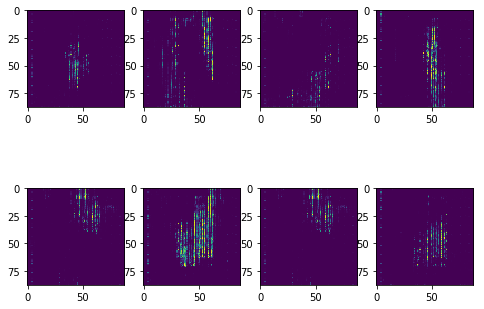

Loss VAE 1181.726066
Loss GAN GEN 0.017257
Loss GAN DISC 0.003115


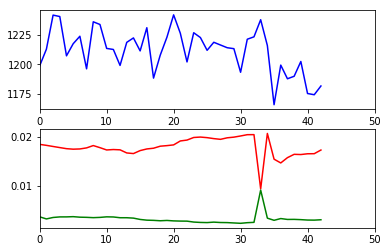

##### EPOCH -  43  ######
DISPLAYING GROUND / CVAE


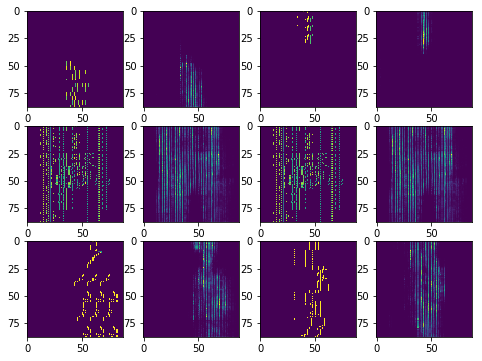

DISPLAYING GENERATED


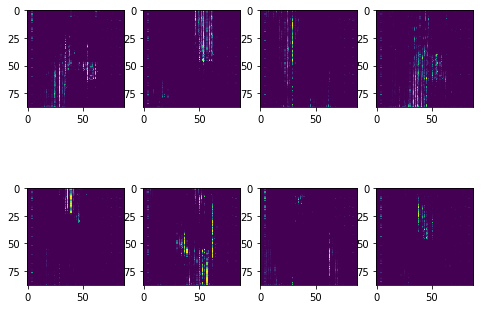

Loss VAE 1179.895079
Loss GAN GEN 0.017714
Loss GAN DISC 0.003128


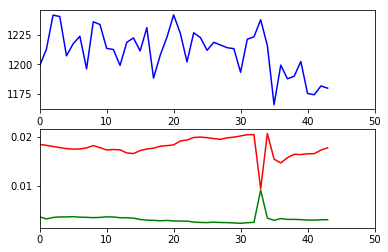

##### EPOCH -  44  ######
DISPLAYING GROUND / CVAE


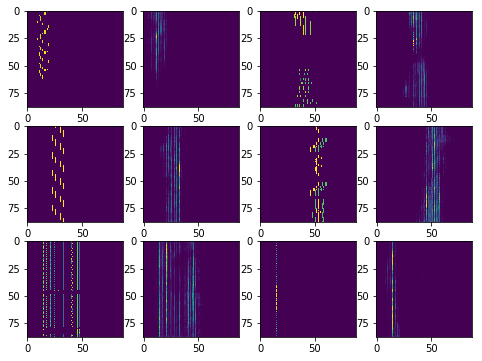

DISPLAYING GENERATED


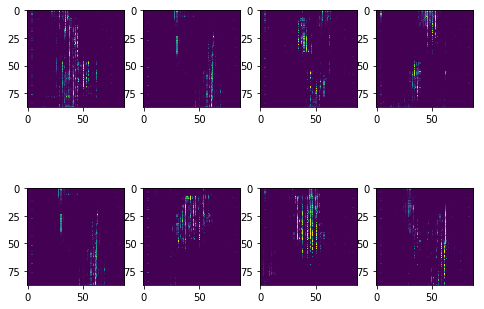

Loss VAE 1191.450069
Loss GAN GEN 0.017710
Loss GAN DISC 0.003023


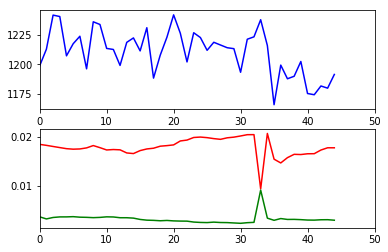

##### EPOCH -  45  ######
DISPLAYING GROUND / CVAE


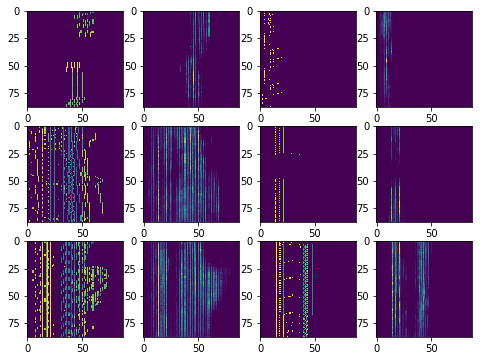

DISPLAYING GENERATED


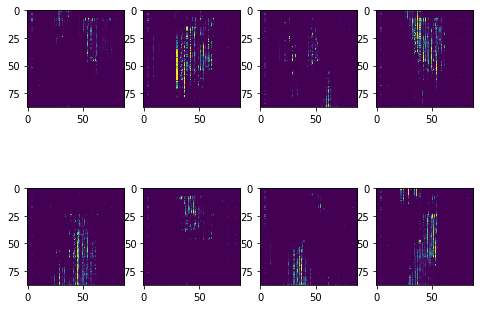

Loss VAE 1181.554141
Loss GAN GEN 0.017870
Loss GAN DISC 0.002977


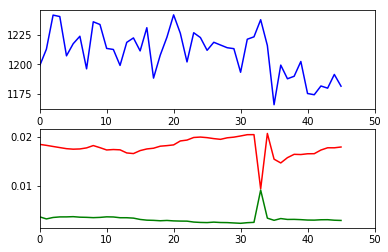

##### EPOCH -  46  ######
DISPLAYING GROUND / CVAE


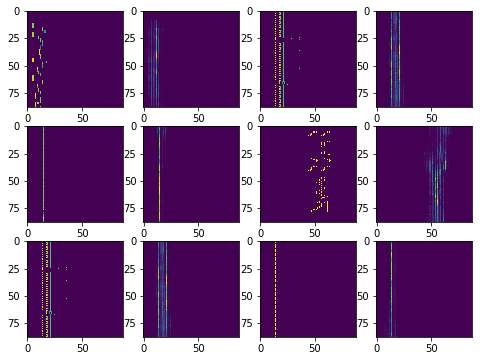

DISPLAYING GENERATED


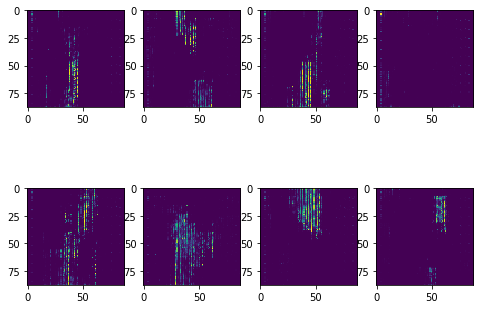

Loss VAE 1203.047517
Loss GAN GEN 0.017722
Loss GAN DISC 0.002975


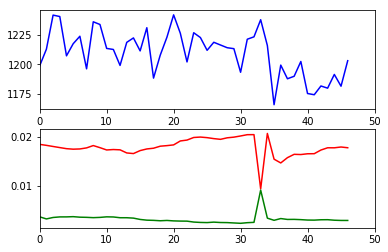

##### EPOCH -  47  ######
DISPLAYING GROUND / CVAE


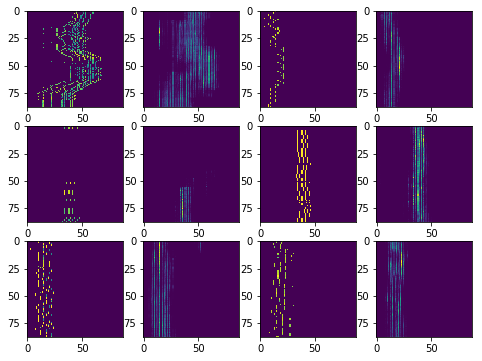

DISPLAYING GENERATED


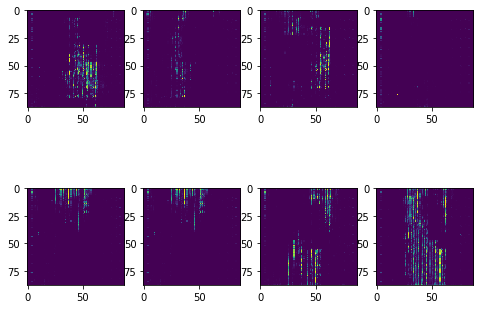

Loss VAE 1193.502320
Loss GAN GEN 0.017809
Loss GAN DISC 0.002938


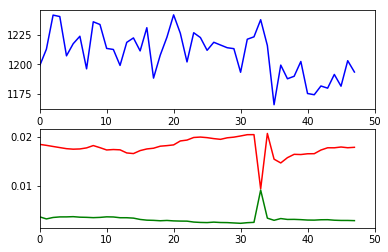

##### EPOCH -  48  ######
DISPLAYING GROUND / CVAE


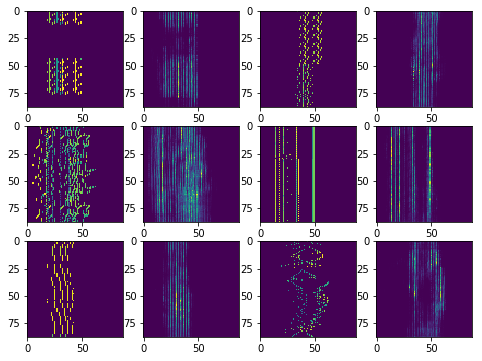

DISPLAYING GENERATED


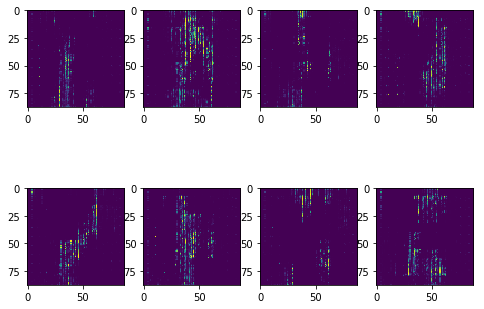

Loss VAE 1181.784021
Loss GAN GEN 0.017998
Loss GAN DISC 0.002998


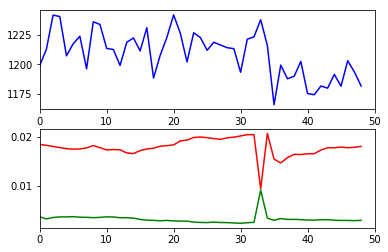

##### EPOCH -  49  ######
DISPLAYING GROUND / CVAE


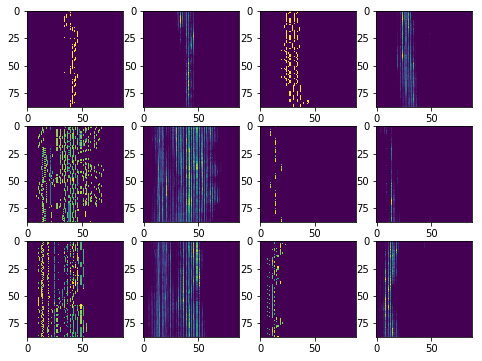

DISPLAYING GENERATED


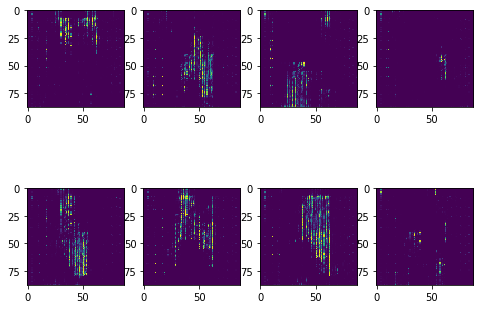

Loss VAE 1182.931662
Loss GAN GEN 0.017701
Loss GAN DISC 0.002975


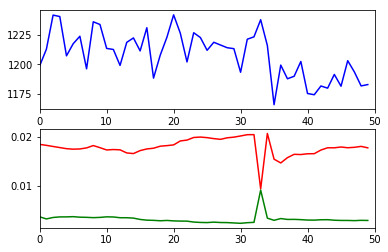

In [16]:
batch_size = 128
hidden_size = 256
learning_rate = 5e-5
gen_learning_rate = 5e-5
disc_learning_rate = 5e-6
max_epoch = 50
updates_per_epoch = int(len(onlyfiles)/batch_size)

#sess = tf.Session()

VAE_INTERVAL = 1

generator_learning_rate = gen_learning_rate
discriminator_learning_rate = disc_learning_rate

with tf.device('/gpu:0'):
    
    training_loss_hist_vae = []
    training_loss_hist_gan_g = []
    training_loss_hist_gan_d = []
    
    for epoch in range(max_epoch):
            training_loss_vae = 0.0
            training_loss_gan_g_loss = 0.0
            training_loss_gan_d_loss = 0.0

            for i in range(updates_per_epoch):
                loss_value_vae, loss_value_gan_d_loss = 0, 0
                images, _ = read_random_data_batch(filepath, batch_size)
                if i % VAE_INTERVAL == 0:
                    loss_value_vae = model.update_params_vae(images)
                    training_loss_vae += loss_value_vae
                loss_value_gan_g_loss, loss_value_gan_d_loss = model.update_params_gan(images, discriminator_learning_rate, generator_learning_rate, True)
                training_loss_gan_g_loss += loss_value_gan_g_loss
                training_loss_gan_d_loss += loss_value_gan_d_loss
            
            print("##### EPOCH - ", epoch, " ######")
            
            ground_images, _ = read_random_data_batch(filepath, batch_size)
            cvae_images = model.run_CVAE(ground_images)
            
            print("DISPLAYING GROUND / CVAE")
            display_pair(ground_images, cvae_images)
            
            print("DISPLAYING GENERATED")
            model.generate_and_show_images(batch_size)
            
            training_loss_vae = training_loss_vae / \
                (int(updates_per_epoch/2) * batch_size)
                
            training_loss_gan_g_loss = training_loss_gan_g_loss / \
                (int(updates_per_epoch) * batch_size)
                
            training_loss_gan_d_loss = training_loss_gan_d_loss / \
                (int(updates_per_epoch) * batch_size)
            
            training_loss_hist_vae.append(training_loss_vae)
            training_loss_hist_gan_g.append(training_loss_gan_g_loss)
            training_loss_hist_gan_d.append(training_loss_gan_d_loss)
            generator_learning_rate = max(gen_learning_rate, min(gen_learning_rate * (training_loss_gan_g_loss / training_loss_gan_d_loss), gen_learning_rate*10))
            discriminator_learning_rate = min(disc_learning_rate, disc_learning_rate * (training_loss_gan_d_loss/training_loss_gan_g_loss))
            
            print("Loss VAE %f" % training_loss_vae)
            print("Loss GAN GEN %f" % training_loss_gan_g_loss)
            print("Loss GAN DISC %f" % training_loss_gan_d_loss)
            
            plt.subplot(2, 1, 1)
            plt.plot(training_loss_hist_vae, c='blue')
            plt.xlim([0, max_epoch])
            plt.subplot(2, 1, 2)
            plt.plot(training_loss_hist_gan_g, c='red')
            plt.plot(training_loss_hist_gan_d, c='green')
            plt.xlim([0, max_epoch])
            plt.show()


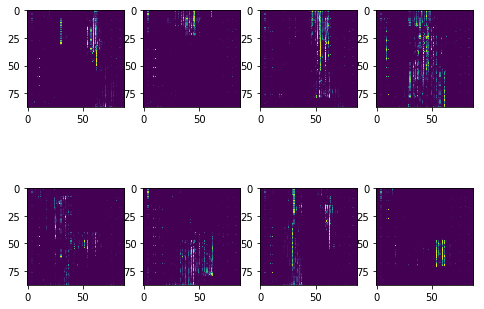

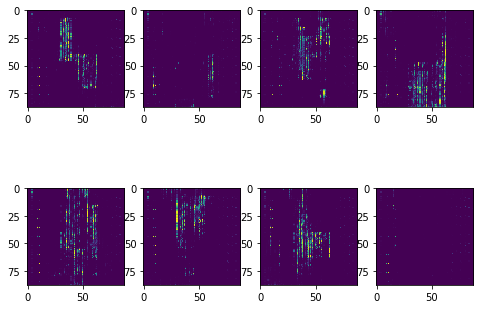

In [17]:
for i in range(2):
    model.generate_and_show_images(batch_size)

In [18]:
songs = model.get_generated_images()
print(np.mean(songs[0]))

0.0254679


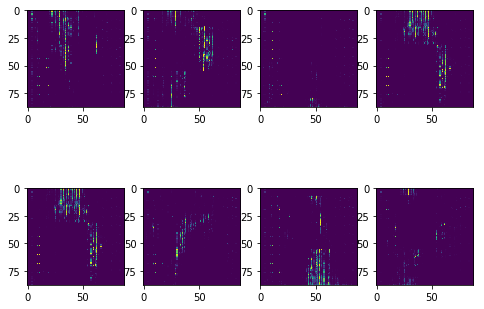

In [19]:
from scipy.stats import threshold
thresholded_songs = []
for each_song in songs:
    each_song *= 127
    each_song = each_song.astype(int)
    #thresholded_song = threshold(each_song, 40)
    thresholded_songs.append(each_song)
thresholded_songs = np.array(thresholded_songs)
display_images(thresholded_songs)

In [20]:
np.save(open("song_gen.npy", "wb"), thresholded_songs[20])

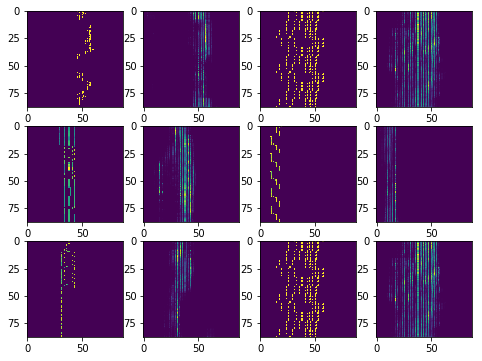

In [21]:
ground_images, _ = read_random_data_batch(filepath, batch_size)
cvae_images = model.run_CVAE(ground_images)
display_pair(ground_images, cvae_images)

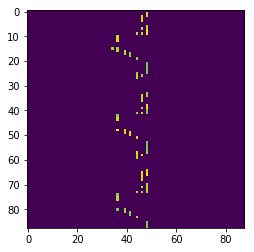

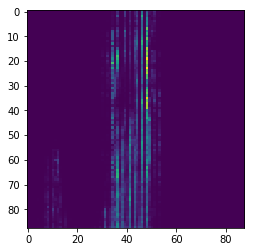

In [22]:
plt.imshow(ground_images[4].reshape(88,88))
plt.show()
plt.imshow(cvae_images[4].reshape(88,88))
plt.show()

In [23]:
ground_images *= 127
ground_images = ground_images.astype(int)

cvae_images *= 127
cvae_images = cvae_images.astype(int)

np.save(open("original.npy", "wb"), ground_images[4])
np.save(open("gen.npy", "wb"), cvae_images[4])